In [ ]:
import json
import os
from collections import defaultdict

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from plot import get_model_style
from matplotlib.gridspec import GridSpec

In [2]:
N_PROMPTS = 100
PROMPT_IDX = list(range(N_PROMPTS))

In [ ]:
df = pd.read_pickle("/ceph/ssd/staff/beyer/llm-quick-check/outputs/attack_runs_2024-12-13_09-49-22.pkl")
df = df[df['prompt_idx'] < N_PROMPTS]
models = sorted(list(df['model'].unique()))
algorithms = sorted(list(df['algorithm'].unique()))

## Visualize

In [ ]:
from functools import lru_cache

@lru_cache
def get_color_for_run(model_type: str, attack_type: str):
    # Define a base color for each model (7 options)

    model_colors = {
        k: v
        for k, v in zip(
            models,
            (
                (255, 0, 0),
                (255, 135, 0),
                (255, 211, 0),
                (222, 255, 10),
                (161, 255, 10),
                (10, 255, 153),
                (10, 239, 255),
                (20, 125, 245),
                (88, 10, 255),
                (190, 10, 255),
                (255, 10, 235),
                (255, 10, 60),
                (255, 10, 10),
                (10, 10, 255),
            ),
        )
    }

    # Define a variation for each attack type
    attack_variation = {
        "autodan": 0.4,
        "ample_gcg": 0.5,
        "direct": 0.6,
        "gcg": 0.7,
        "human_jailbreaks": 0.8,
        "pair": 0.85,
        "pgd": 0.9,
        "pgd_one_hot": 1.0,
    }

    # Get the base color for the model
    base_color = np.array(model_colors[model_type])

    # Adjust the color based on the attack type (by scaling the brightness)
    adjusted_color = np.clip(base_color * attack_variation[attack_type], 0, 255) / 255.0

    return adjusted_color


def ragged_mean(sequences, pad=np.nan, side='right'):
    # Find the maximum length of the sequences
    max_len = max(len(seq) for seq in sequences)

    # Pad sequences with NaN to make them the same length
    if pad is np.nan:
        padded_sequences = np.full((len(sequences), max_len), np.nan)
    elif pad == 'max':
        padded_sequences = np.tile([max(seq, default=np.nan) for seq in sequences], [max_len, 1]).T
    elif pad == 'min':
        padded_sequences = np.tile([min(seq, default=np.nan) for seq in sequences], [max_len, 1]).T
    elif pad == 'last':
        padded_sequences = np.tile([(seq[-1] if seq else np.nan) for seq in sequences], [max_len, 1]).T
    else:
        raise ValueError(f'Invalid padding value: {pad}')
    if side == 'right':
        for i, seq in enumerate(sequences):
            padded_sequences[i, : len(seq)] = seq
    elif side == 'left':
        for i, seq in enumerate(sequences):
            padded_sequences[i, -len(seq):] = seq
    else:
        raise ValueError(f'Invalid side value: {side}')

    return np.nanmean(padded_sequences, axis=0)


def filter_runs(runs: pd.DataFrame, model_name=None, algorithm_type=None, algorithm_params=None, exact_match=False):
    def matches(value, target):
        if pd.isna(value):  # Handle NaN values gracefully
            return False
        if target is None:
            return True
        comp_func = str.__eq__ if exact_match or algorithm_params is not None else str.__contains__
        if isinstance(target, str):
            return comp_func(value.lower(), target.lower())
        if isinstance(target, dict):
            if exact_match:
                return value == target
            return all(value[k] == v for k, v in target.items())
        return any(comp_func(value.lower(), t.lower()) for t in target)

    # Apply the matches function to filter runs
    filtered_runs = runs[
        runs['model'].apply(lambda model: matches(model, model_name))
        & runs['algorithm'].apply(lambda algorithm: matches(algorithm, algorithm_type))
        & runs['algorithm_params'].apply(lambda algorithm_p: matches(json.loads(algorithm_p), algorithm_params))
    ]
    return filtered_runs

In [61]:
def plot_prompts(idx, metric='loss', model_name: None|str|list[str] = None, algorithm_type: None|str|list[str] = None, exact_match=False):
    if not isinstance(idx, list):
        idx = [idx]
    n = 0
    to_plot = {}
    for i in idx:
        prompt_runs = filter_runs(df[df['prompt_idx'] == i], model_name, algorithm_type, exact_match=exact_match)
        for _, run in prompt_runs.iterrows():
            key = (run['model'], run['algorithm'])
            to_plot.setdefault(key, []).append(run[metric])

    plt.figure(figsize=(15, 6))
    last_means = {}
    for key, values in to_plot.items():
        model, algorithm = key
        for value in values:
            if metric == 'loss':
                plt.plot(value, alpha=min(0.1, (1.5/len(values))), c=get_color_for_run(model, algorithm))
            else:
                plt.scatter(np.arange(len(value)), value, alpha=min(0.1, (1.5/len(values))), color=get_color_for_run(model, algorithm), s=6)
        plt.plot(ragged_mean(values), label=f"{model} | {algorithm}", c=get_color_for_run(model, algorithm))
        last_means[f"{model} | {algorithm}"] = ragged_mean(values)[-1]
        n += len(values)

    if metric == 'loss':
        plt.yscale('log')
        # plt.yscale('symlog')
    plt.title(f"{metric} for {n} runs across {len(idx)} prompts, model={model_name if model_name is not None else "All"}, attack={algorithm_type}")
    plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
    plt.xlabel("Step")
    plt.legend(loc='lower left')
    # Plot the average metric across all models
    avg_metric = ragged_mean([value for values in to_plot.values() for value in values])
    last_means['Average'] = avg_metric[-1]
    plt.plot(avg_metric, label="Average", linestyle='--', color='black')
    handles, labels = plt.gca().get_legend_handles_labels()
    sorted_labels_handles = sorted(zip(labels, handles), key=lambda x: -last_means[x[0]])
    sorted_labels, sorted_handles = zip(*sorted_labels_handles)
    plt.legend(sorted_handles, sorted_labels, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()


# methods which generate anyways can use accum here
aggregator_functions = {
    "ample_gcg": np.maximum.accumulate,
    "autodan": np.maximum.accumulate,
    "direct": np.maximum.accumulate,
    "gcg": lambda x: x,
    "human_jailbreaks": np.maximum.accumulate,
    "pair": np.maximum.accumulate,
    "pgd": lambda x: x,
    "pgd_one_hot": lambda x: x,
}

In [62]:
def plot_asr(idx, model_name: None|str|list[str] = None, algorithm_type: None|str|list[str] = None, criterion='asr_cais', exact_match=False):
    if not isinstance(idx, list):
        idx = [idx]
    n = 0
    to_plot = {}
    for i in idx:
        prompt_runs = filter_runs(df[df['prompt_idx'] == i], model_name, algorithm_type, exact_match=exact_match)
        for _, run in prompt_runs.iterrows():
            key = (run['model'], run['algorithm'])
            to_plot.setdefault(key, []).append(run[criterion])

    y = []
    labels = []
    colors = []
    for key, values in to_plot.items():
        model, attack = key
        n += len(values)
        y.append(ragged_mean([[any(v)] for v in values])[0])

        labels.append(f"{model} | {attack}")
        colors.append(get_color_for_run(model, attack))
    sorted_indices = np.argsort(labels)
    sorted_labels = np.array(labels)[sorted_indices]
    sorted_y = np.array(y)[sorted_indices]
    sorted_colors = np.array(colors)[sorted_indices]

    plt.figure(figsize=(12, 6))
    plt.bar(sorted_labels, sorted_y, color=sorted_colors)
    for i, v in enumerate(sorted_y):
        plt.text(i, v - 0.04, f"{v:.2f}", color='white', ha='center')
    plt.title(f"success for {n} runs across {len(idx)} prompts, model={model_name}, attack={algorithm_type}")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

## AmpleGCG makes 200 'steps' in parallel, so they should all have approx equal success:

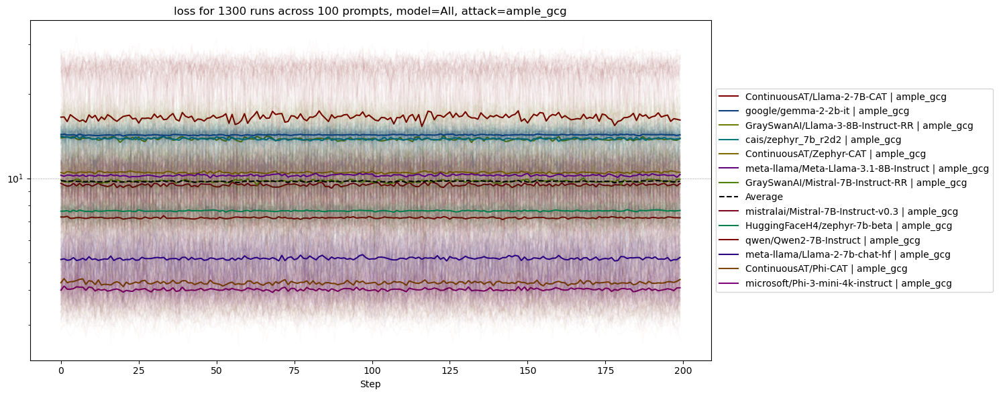

In [63]:
plot_prompts(PROMPT_IDX, 'loss', model_name=None, algorithm_type='ample_gcg')

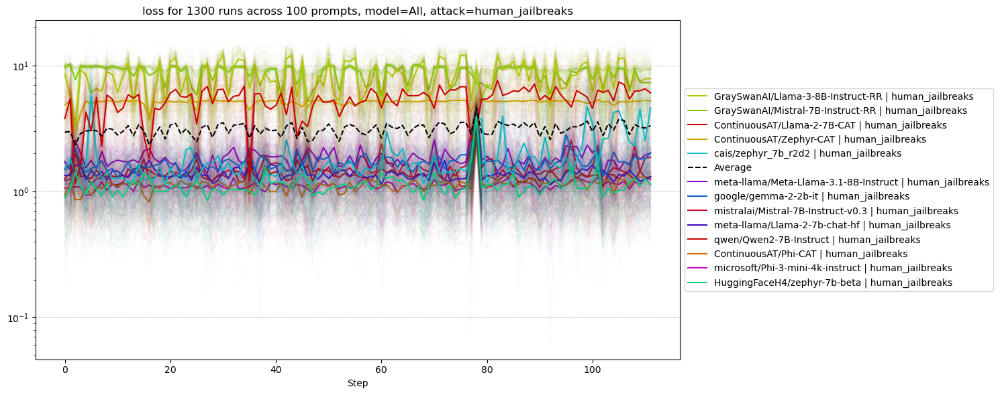

In [64]:
plot_prompts(PROMPT_IDX, 'loss', model_name=None, algorithm_type='human_jailbreaks')

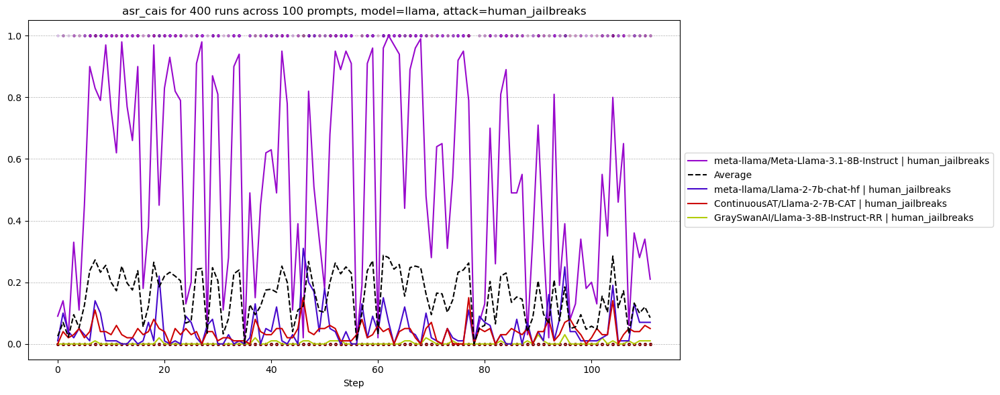

In [65]:
plot_prompts(PROMPT_IDX, 'asr_cais', model_name='llama', algorithm_type='human_jailbreaks')

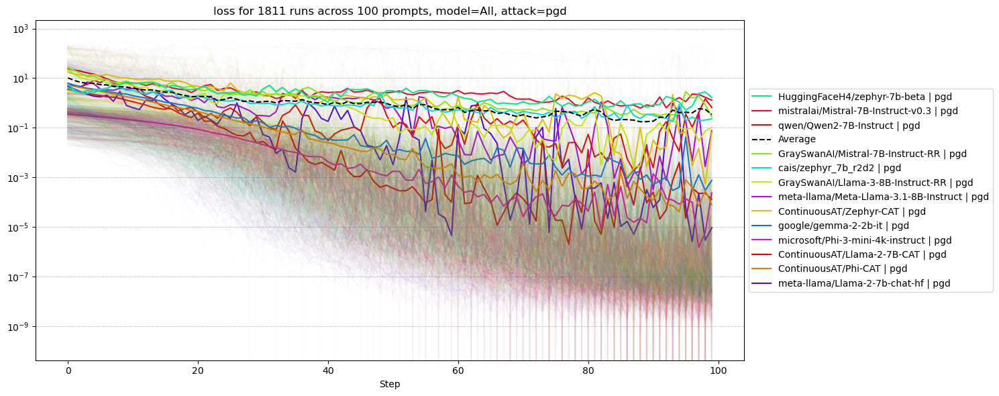

In [66]:
plot_prompts(PROMPT_IDX, 'loss', model_name=None, algorithm_type='pgd', exact_match=True)

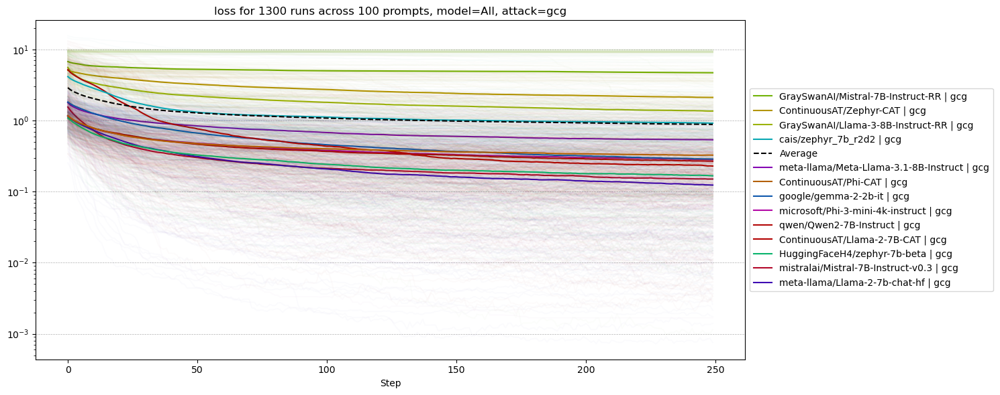

In [67]:
plot_prompts(PROMPT_IDX, 'loss', model_name=None, algorithm_type='gcg', exact_match=True)

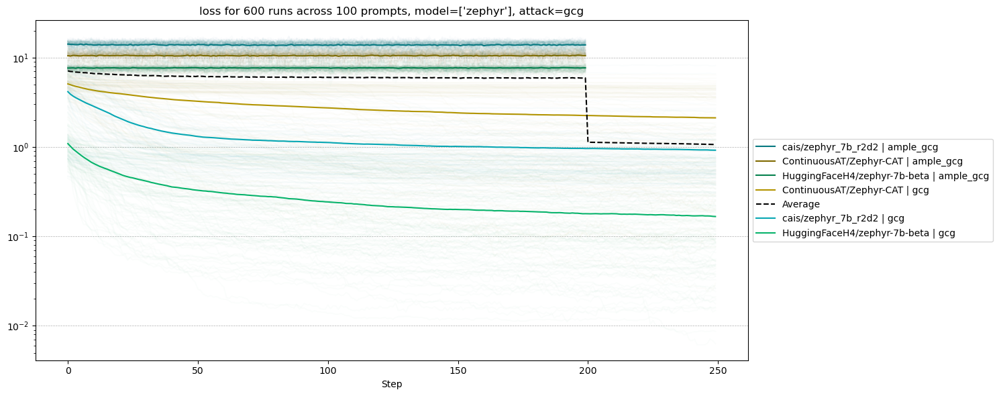

In [68]:
plot_prompts(PROMPT_IDX, 'loss', model_name=['zephyr'], algorithm_type='gcg')

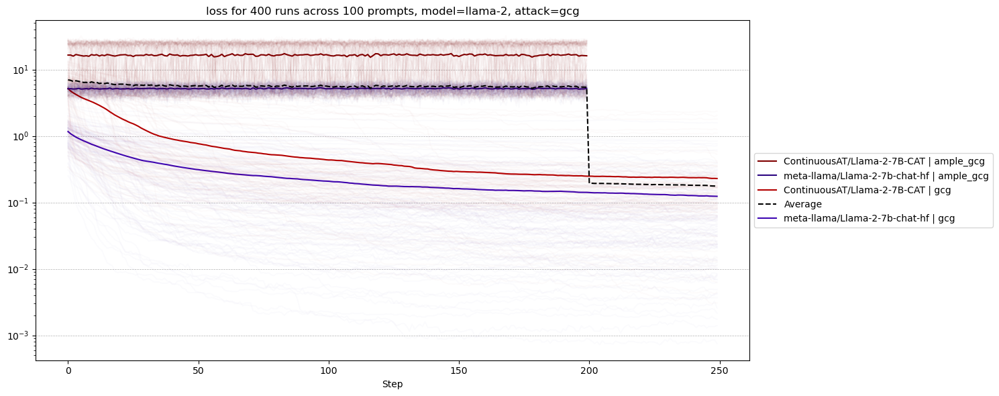

In [18]:
plot_prompts(PROMPT_IDX, 'loss', model_name='llama-2', algorithm_type='gcg')

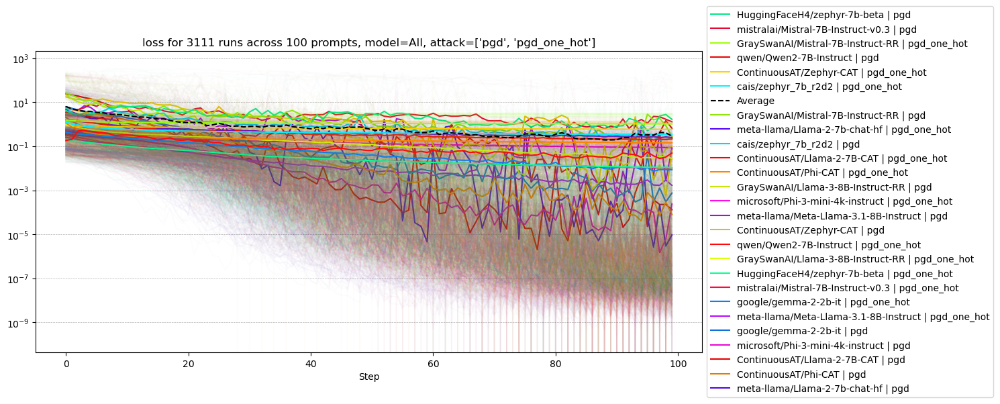

In [69]:
plot_prompts(PROMPT_IDX, 'loss', model_name=None, algorithm_type=['pgd', 'pgd_one_hot'], exact_match=True)

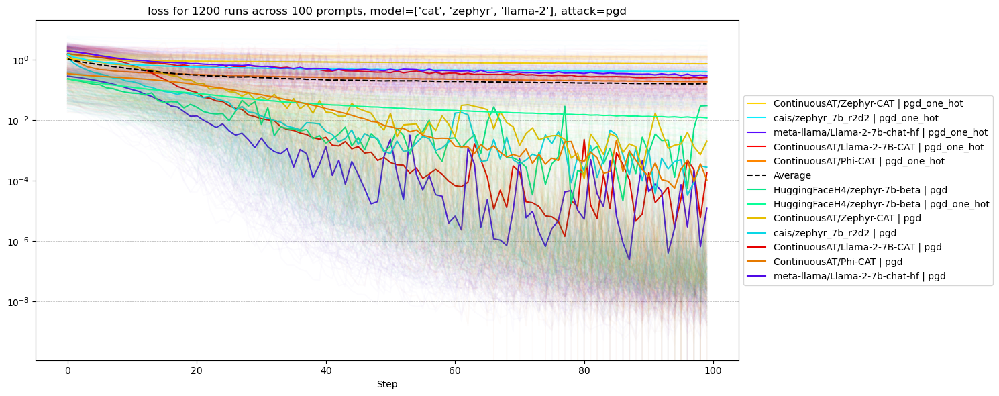

In [20]:
plot_prompts(PROMPT_IDX, 'loss', model_name=['cat', 'zephyr', 'llama-2'], algorithm_type='pgd')

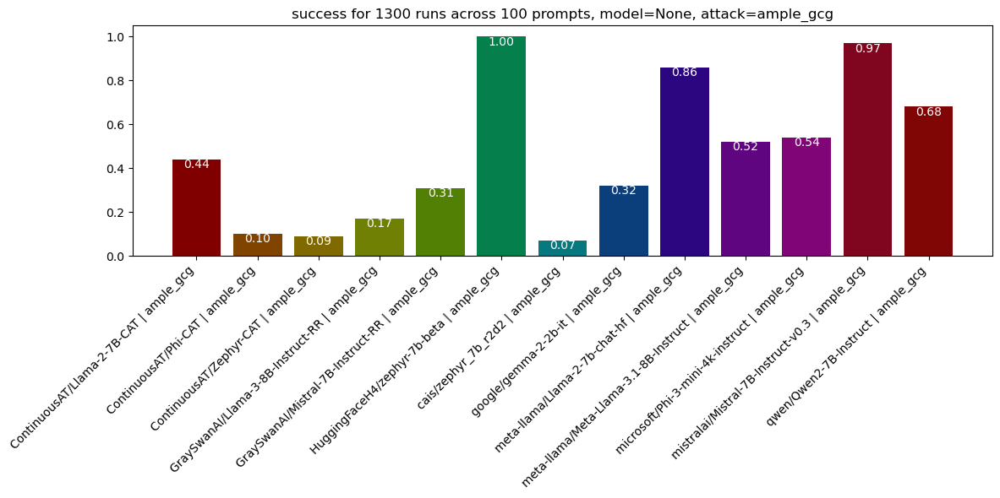

In [22]:
plot_asr(PROMPT_IDX, model_name=None, algorithm_type='ample_gcg')

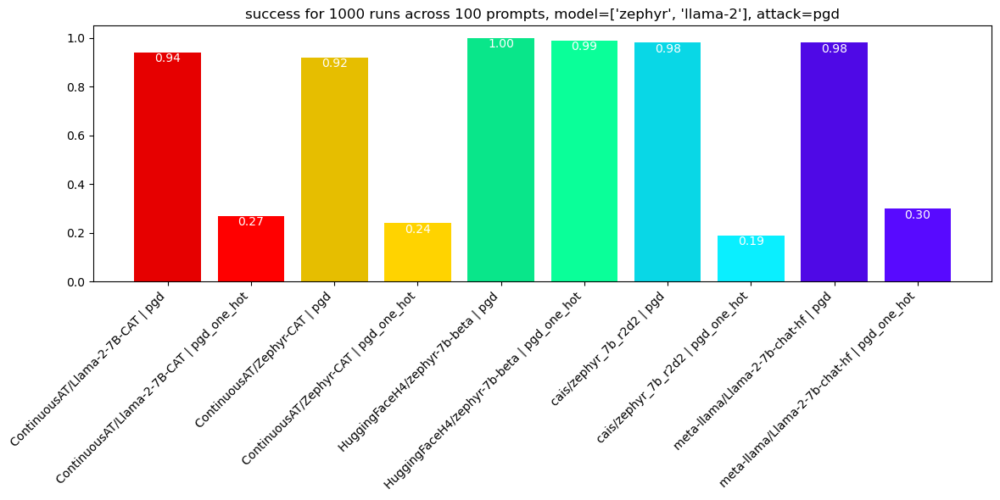

In [23]:
plot_asr(PROMPT_IDX, model_name=['zephyr', 'llama-2'], criterion='asr_cais', algorithm_type='pgd')

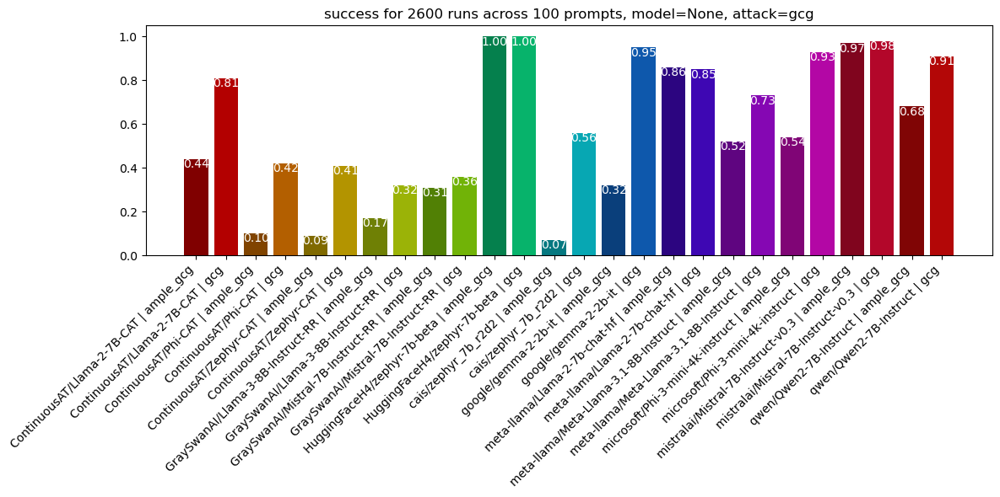

In [24]:
plot_asr(PROMPT_IDX, model_name=None, criterion='asr_cais', algorithm_type='gcg', exact_match=True)

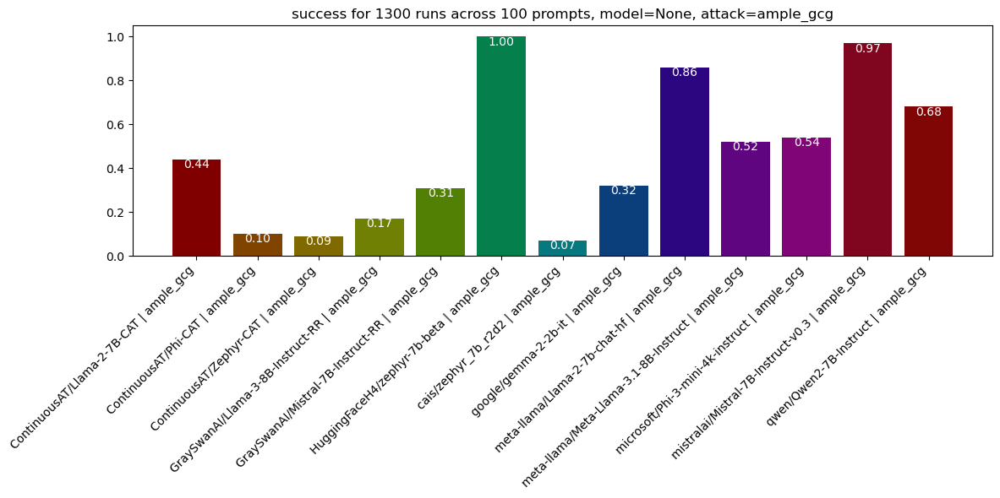

In [25]:
plot_asr(PROMPT_IDX, model_name=None, algorithm_type='ample_gcg')

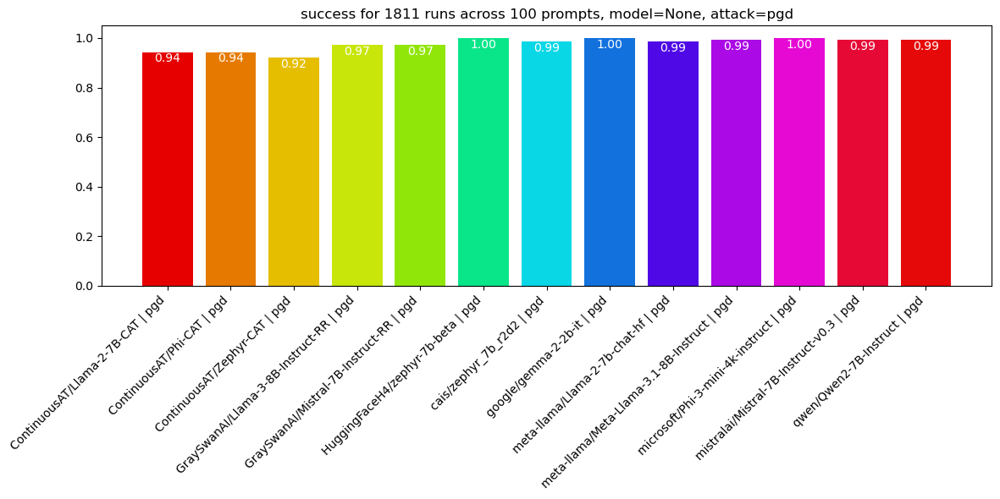

In [59]:
plot_asr(PROMPT_IDX, model_name=None, algorithm_type='pgd', exact_match=True, criterion='asr_cais')

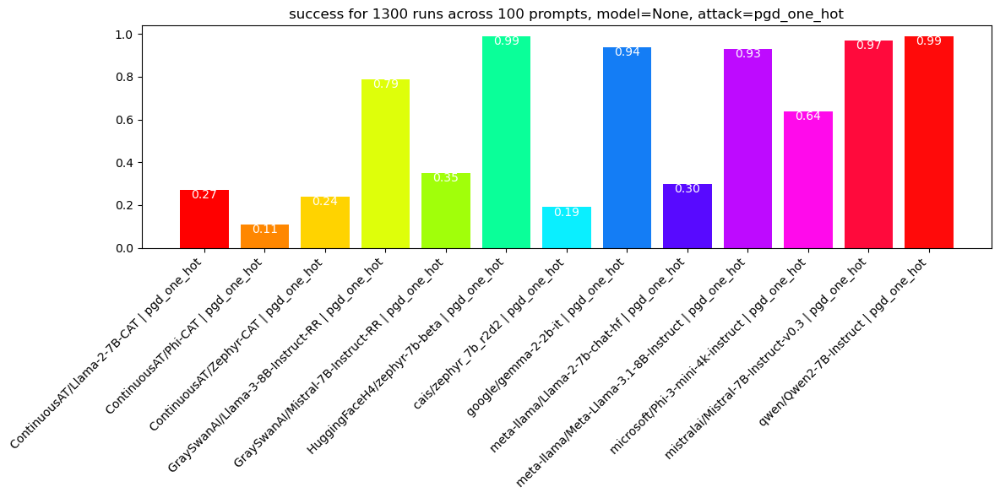

In [27]:
plot_asr(PROMPT_IDX, model_name=None, algorithm_type='pgd_one_hot')

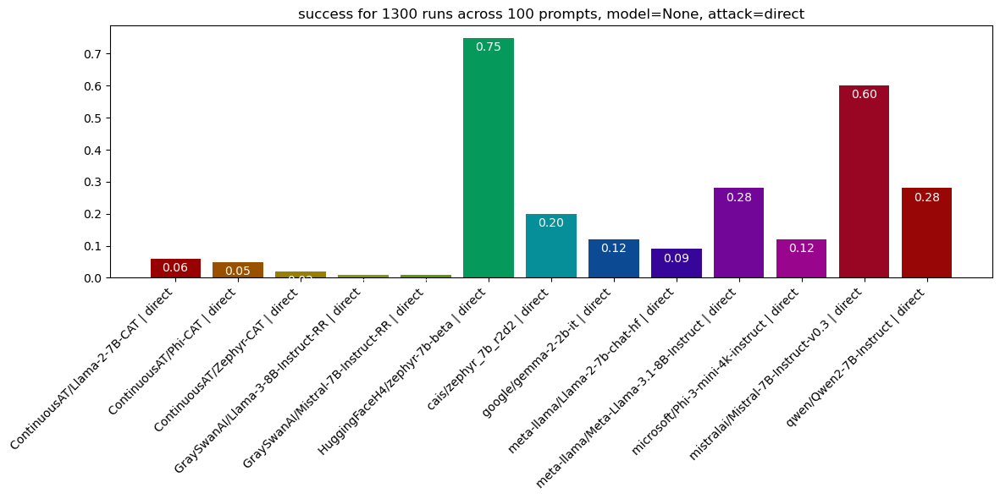

In [28]:
plot_asr(PROMPT_IDX, model_name=None, algorithm_type='direct')

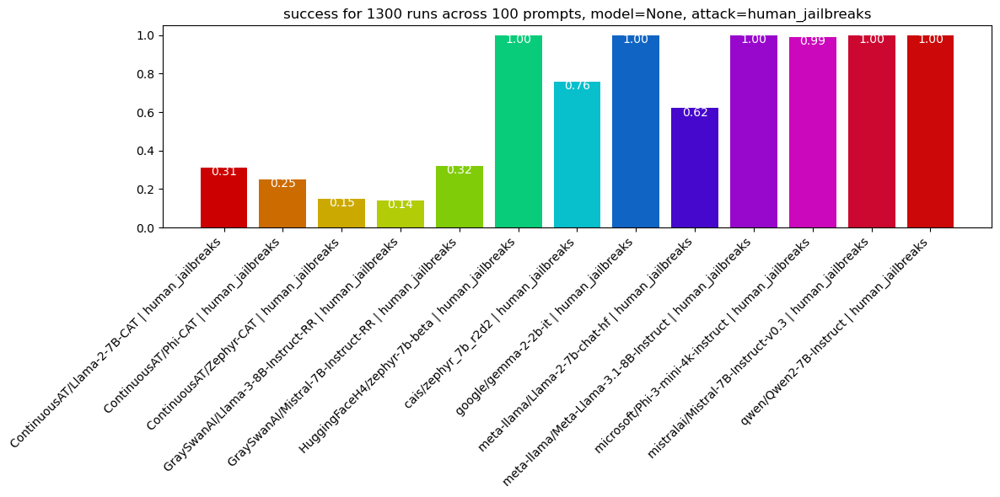

In [29]:
plot_asr(PROMPT_IDX, model_name=None, algorithm_type='human_jailbreaks')

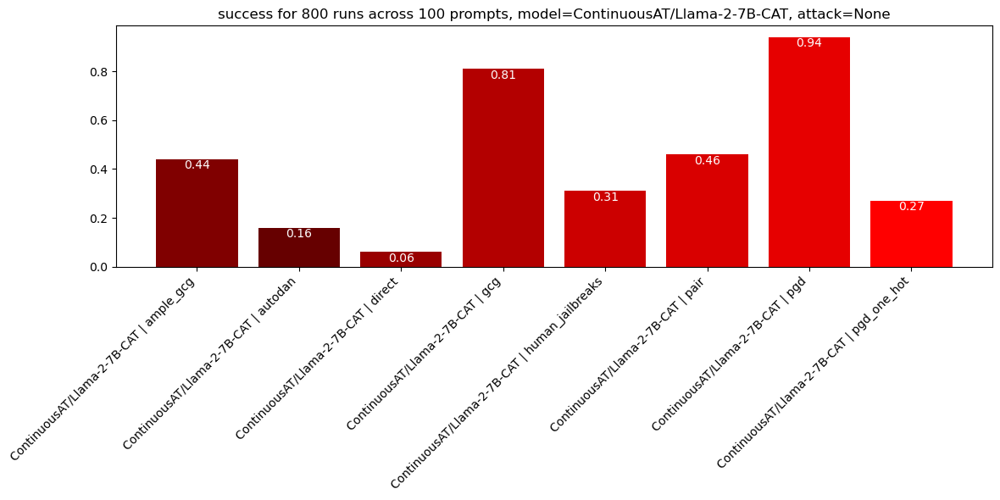

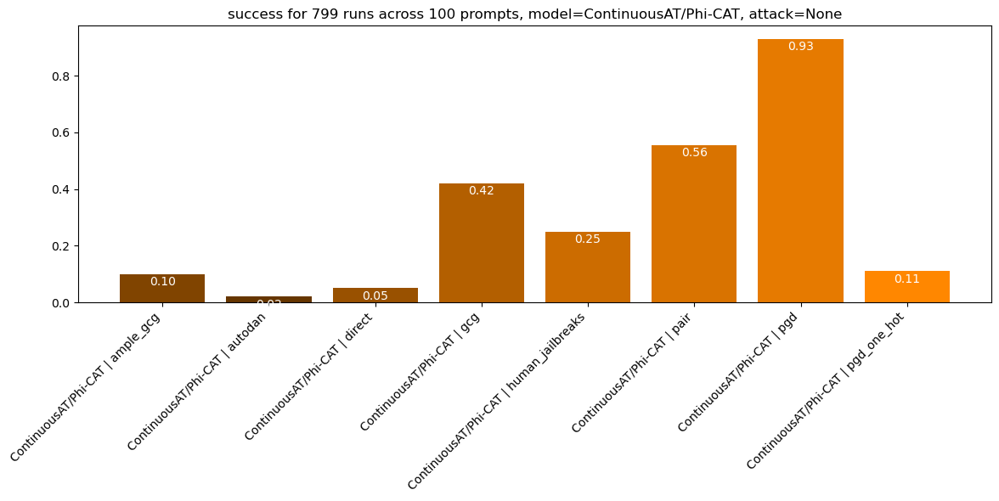

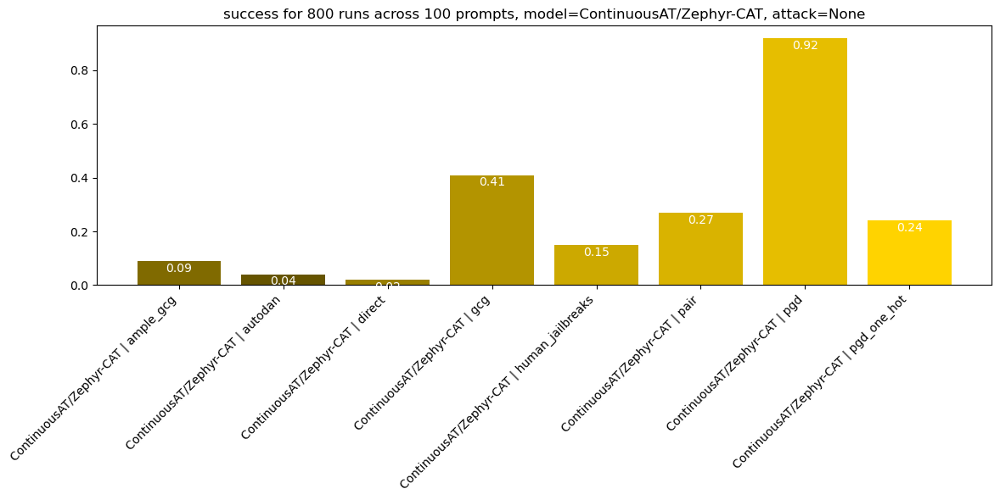

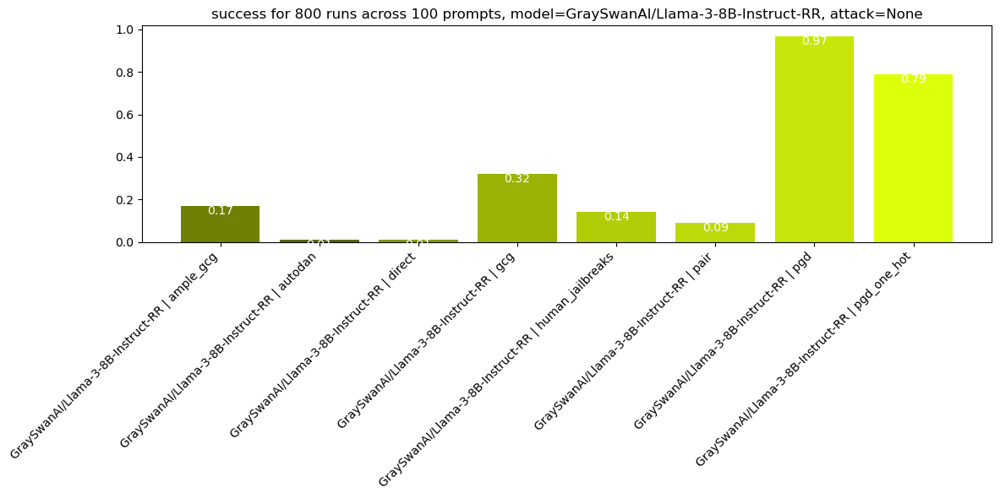

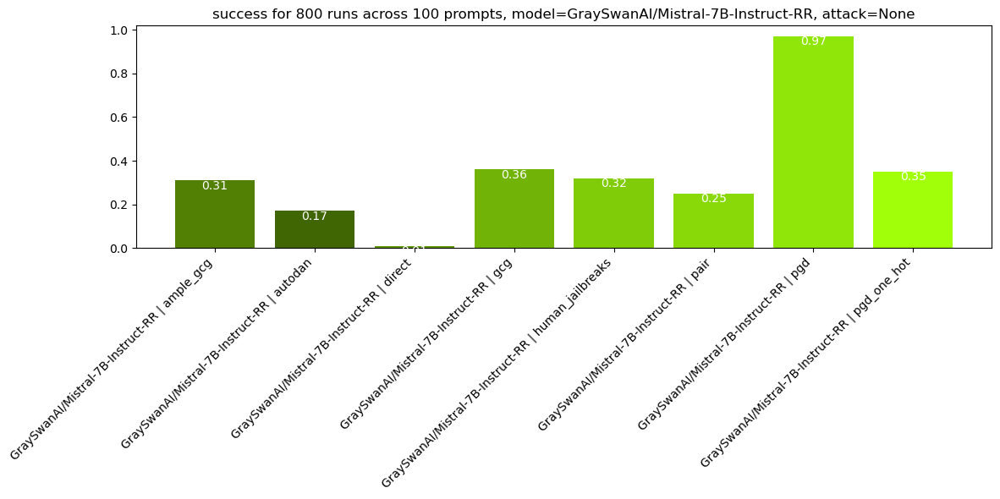

...

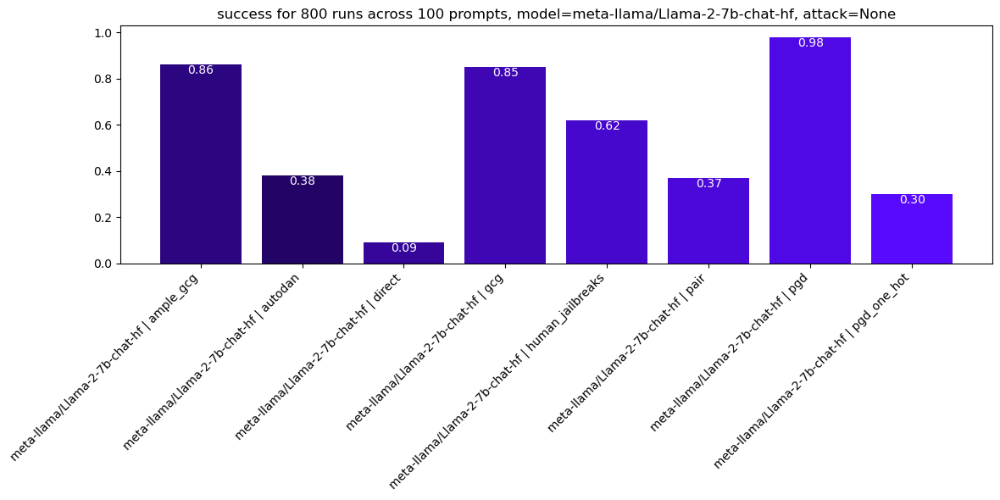

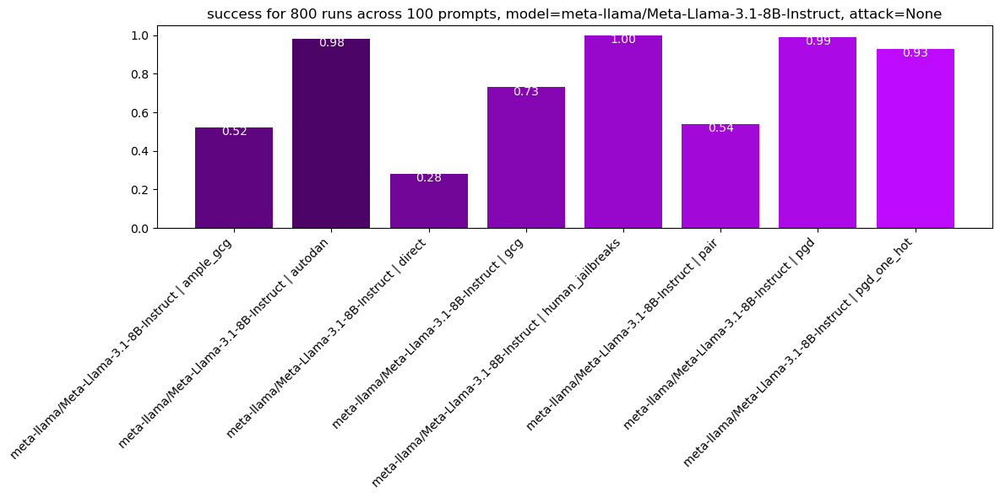

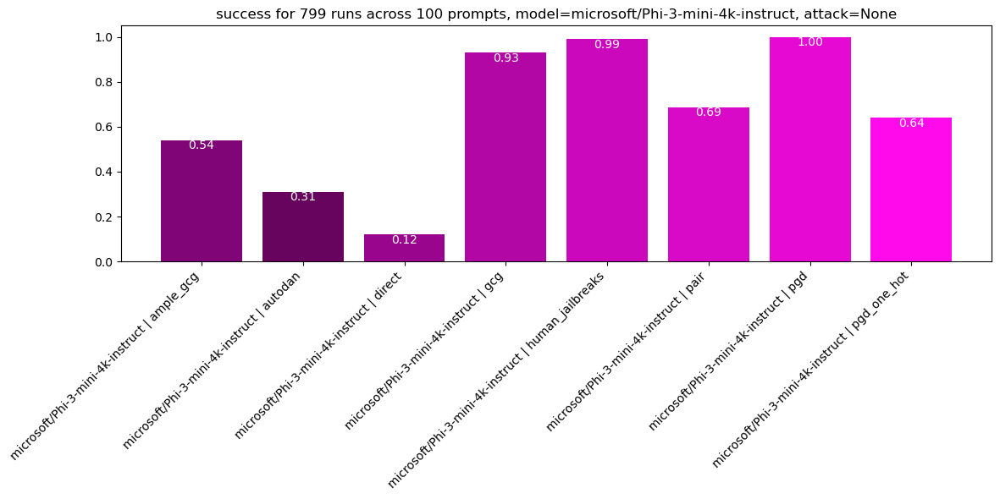

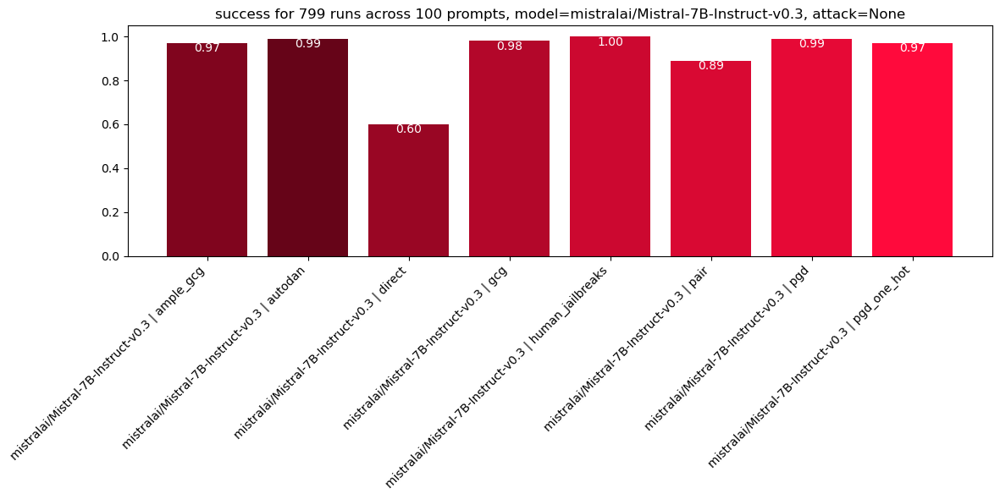

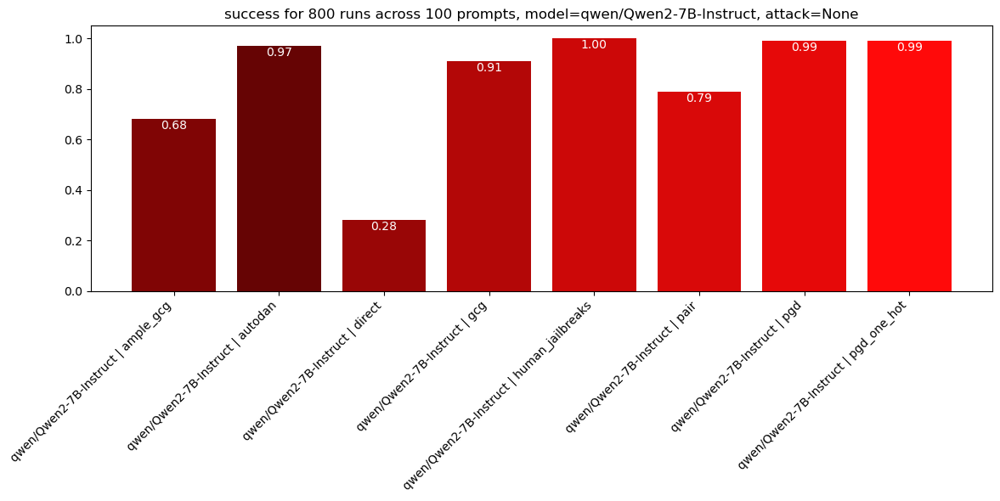

In [30]:
for model_name in models:
    plot_asr(PROMPT_IDX, model_name=model_name, algorithm_type=None)

# Judge ASR vs Prefix ASR

In [7]:
# Flatten each series of lists into a single series of binary values
flattened_asr_cais = pd.Series([item for sublist in df["asr_cais"] for item in sublist])
flattened_asr_prefix = pd.Series([item for sublist in df["asr_prefix"] for item in sublist])

# Ensure both flattened series are of the same length (truncate to the minimum length)
min_length = min(len(flattened_asr_cais), len(flattened_asr_prefix))
flattened_asr_cais = flattened_asr_cais[:min_length]
flattened_asr_prefix = flattened_asr_prefix[:min_length]

# Compute the correlation coefficient (Pearson)
correlation = np.corrcoef(flattened_asr_cais, flattened_asr_prefix)[0, 1]
print(f"Correlation between asr_cais and asr_prefix: {correlation}")

Correlation between asr_cais and asr_prefix: 0.45125573201389857


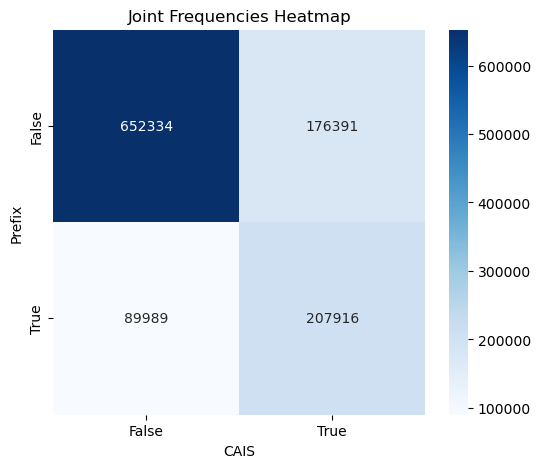

In [8]:
# Create DataFrame
data = pd.DataFrame({'Prefix': flattened_asr_prefix, 'CAIS': flattened_asr_cais})
# Compute joint frequencies for heatmap
joint_freq = pd.crosstab(data['Prefix'], data['CAIS'])

# Plot 1: Heatmap of Joint Frequencies
plt.figure(figsize=(6, 5))
sns.heatmap(joint_freq, annot=True, fmt='d', cmap='Blues', cbar=True)
plt.title('Joint Frequencies Heatmap')
plt.xlabel('CAIS')
plt.ylabel('Prefix')
plt.show()

# Are some prompts harder to break than others?

In [33]:
def plot_avg_per_prompt(idx, metric='loss', model_name: None|str|list[str] = None, algorithm_type: None|str|list[str] = None):
    if not isinstance(idx, list):
        idx = [idx]
    prompt_runs = filter_runs(df[df['prompt_idx'].isin(idx)], model_name, algorithm_type)
    op = np.min if metric == 'loss' else np.max

    # Group by 'prompt_idx' and calculate the metric for each group
    data = (
        prompt_runs.groupby('prompt_idx', group_keys=False)
        .apply(lambda x: [{'key': (row['model'], row['algorithm']), 'value': op(row[metric])} for _, row in x.iterrows()])
        .tolist()
    )

    labels = np.arange(len(data))

    plt.figure(figsize=(12, 6))

    if metric == 'loss':
        plt.violinplot([[d_['value'] for d_ in prompt_data] for prompt_data in data])
        plt.yscale('log')
        # Plot scatter points on top of the violins
        for i, prompt_data in enumerate(data):
            c = [get_color_for_run(*d_['key']) for d_ in prompt_data]
            plt.scatter([i + 1] * len(prompt_data), [d__['value'] for d__ in prompt_data], alpha=0.1, c=c)
    else:
        plt.scatter(np.arange(1, len(data) + 1), [np.mean([d_['value'] for d_ in prompt_data]) for prompt_data in data])

    plt.xticks(ticks=np.arange(1, len(labels) + 1, step=10), labels=labels[::10], rotation=90)
    plt.ylabel(metric)
    plt.title(f"Average {metric} for {len(idx)} prompts, model={model_name if model_name is not None else "All"}, attack={algorithm_type}")
    plt.xlabel("Prompt index")


/tmp/ipykernel_641852/1986790823.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: [{'key': (row['model'], row['algorithm']), 'value': op(row[metric])} for _, row in x.iterrows()])


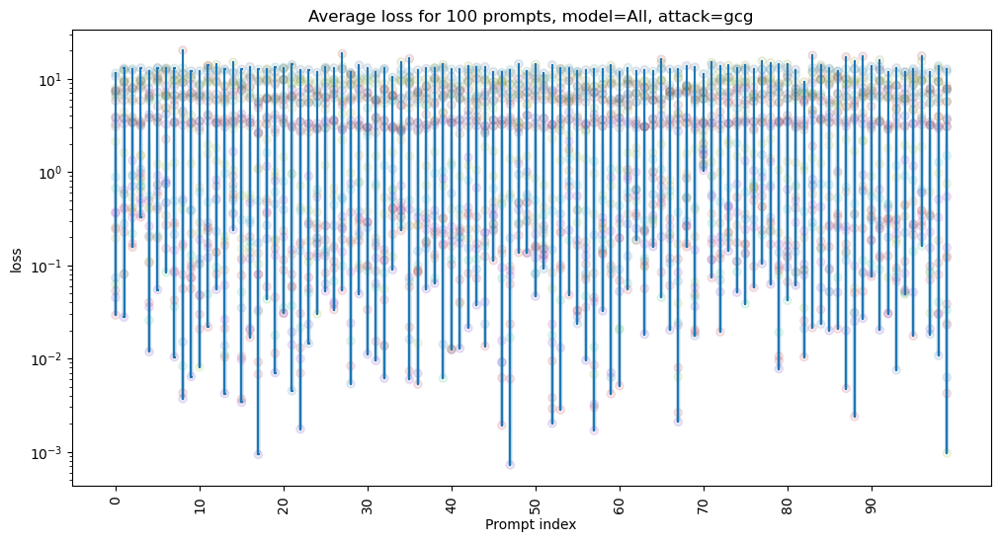

In [34]:
plot_avg_per_prompt(PROMPT_IDX, 'loss', model_name=None, algorithm_type='gcg')

/tmp/ipykernel_641852/1986790823.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: [{'key': (row['model'], row['algorithm']), 'value': op(row[metric])} for _, row in x.iterrows()])


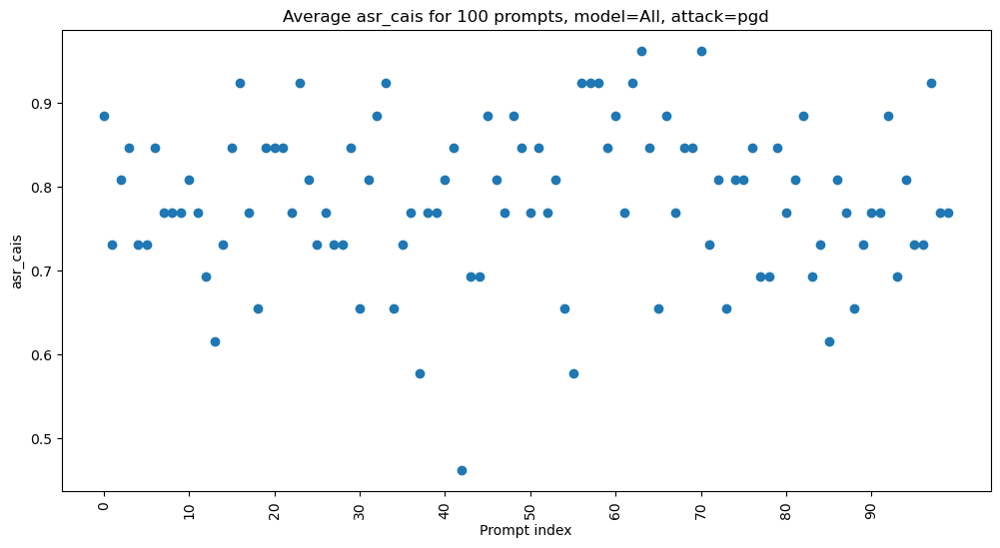

In [35]:
plot_avg_per_prompt(PROMPT_IDX, 'asr_cais', model_name=None, algorithm_type='pgd')

/tmp/ipykernel_641852/1986790823.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: [{'key': (row['model'], row['algorithm']), 'value': op(row[metric])} for _, row in x.iterrows()])


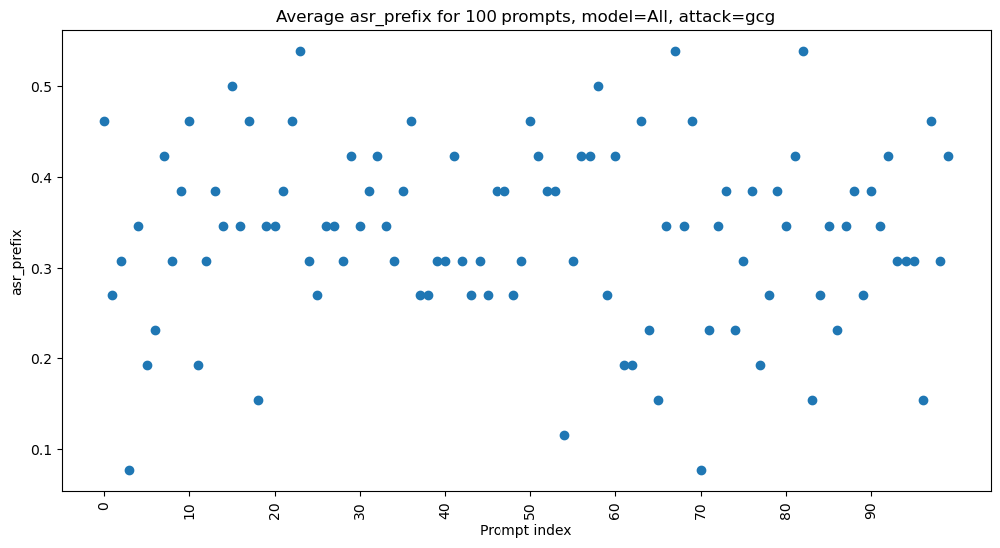

In [36]:
plot_avg_per_prompt(PROMPT_IDX, 'asr_prefix', model_name=None, algorithm_type='gcg')

cais/zephyr_7b_r2d2 | ample_gcg: 0.07
ContinuousAT/Zephyr-CAT | ample_gcg: 0.09
ContinuousAT/Phi-CAT | ample_gcg: 0.10
GraySwanAI/Llama-3-8B-Instruct-RR | ample_gcg: 0.17
GraySwanAI/Mistral-7B-Instruct-RR | ample_gcg: 0.31
GraySwanAI/Llama-3-8B-Instruct-RR | gcg: 0.32
google/gemma-2-2b-it | ample_gcg: 0.32
GraySwanAI/Mistral-7B-Instruct-RR | gcg: 0.36
ContinuousAT/Zephyr-CAT | gcg: 0.41
ContinuousAT/Phi-CAT | gcg: 0.42
ContinuousAT/Llama-2-7B-CAT | ample_gcg: 0.44
meta-llama/Meta-Llama-3.1-8B-Instruct | ample_gcg: 0.52
microsoft/Phi-3-mini-4k-instruct | ample_gcg: 0.54
cais/zephyr_7b_r2d2 | gcg: 0.56
qwen/Qwen2-7B-Instruct | ample_gcg: 0.68
meta-llama/Meta-Llama-3.1-8B-Instruct | gcg: 0.73
ContinuousAT/Llama-2-7B-CAT | gcg: 0.81
meta-llama/Llama-2-7b-chat-hf | gcg: 0.85
meta-llama/Llama-2-7b-chat-hf | ample_gcg: 0.86
qwen/Qwen2-7B-Instruct | gcg: 0.91
microsoft/Phi-3-mini-4k-instruct | gcg: 0.93
google/gemma-2-2b-it | gcg: 0.95
mistralai/Mistral-7B-Instruct-v0.3 | ample_gcg: 0.97
mistr

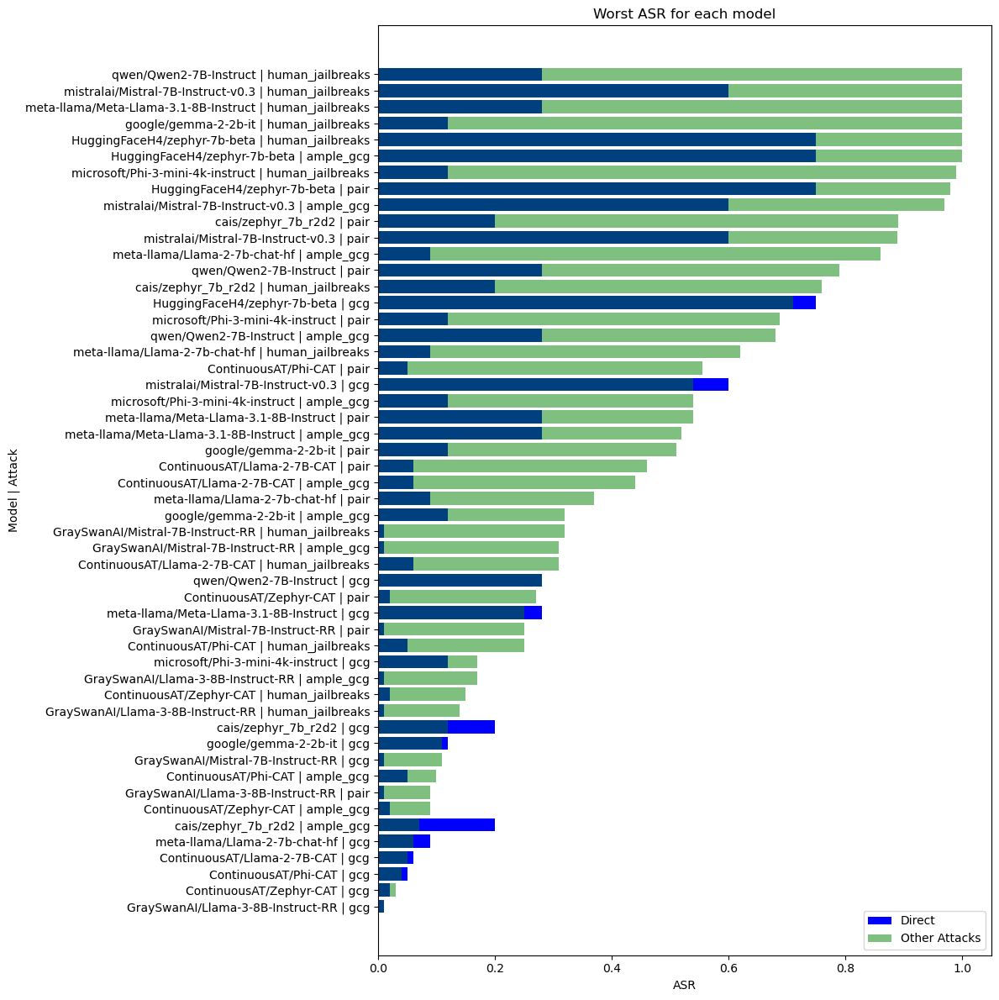

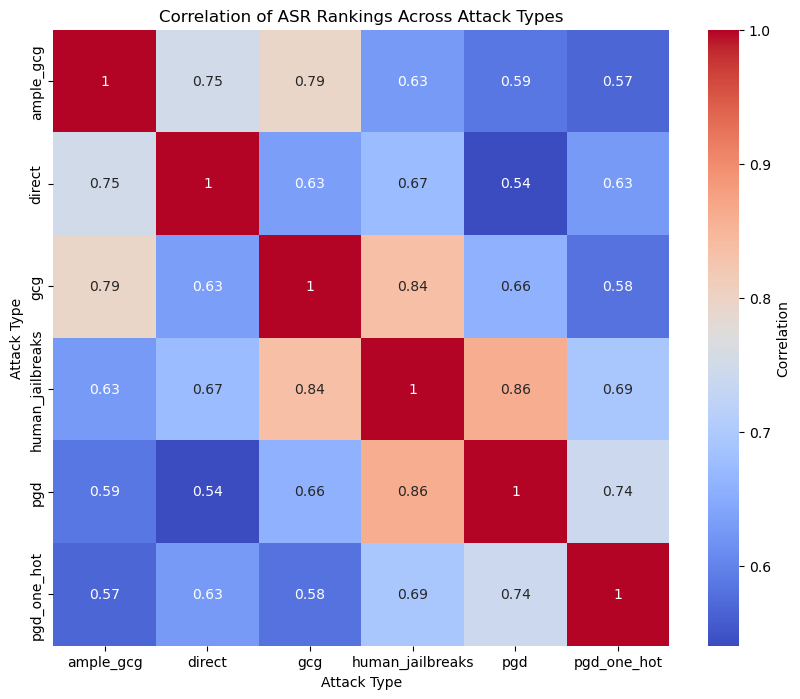

                                       ample_gcg  direct   gcg  \
ContinuousAT/Llama-2-7B-CAT                 0.44    0.06  0.81   
ContinuousAT/Phi-CAT                        0.10    0.05  0.42   
ContinuousAT/Zephyr-CAT                     0.09    0.02  0.41   
GraySwanAI/Llama-3-8B-Instruct-RR           0.17    0.01  0.32   
GraySwanAI/Mistral-7B-Instruct-RR           0.31    0.01  0.36   
HuggingFaceH4/zephyr-7b-beta                1.00    0.75  1.00   
cais/zephyr_7b_r2d2                         0.07    0.20  0.56   
google/gemma-2-2b-it                        0.32    0.12  0.95   
meta-llama/Llama-2-7b-chat-hf               0.86    0.09  0.85   
meta-llama/Meta-Llama-3.1-8B-Instruct       0.52    0.28  0.73   
microsoft/Phi-3-mini-4k-instruct            0.54    0.12  0.93   
mistralai/Mistral-7B-Instruct-v0.3          0.97    0.60  0.98   
qwen/Qwen2-7B-Instruct                      0.68    0.28  0.91   

                                       human_jailbreaks   pgd  pgd_one_hot 

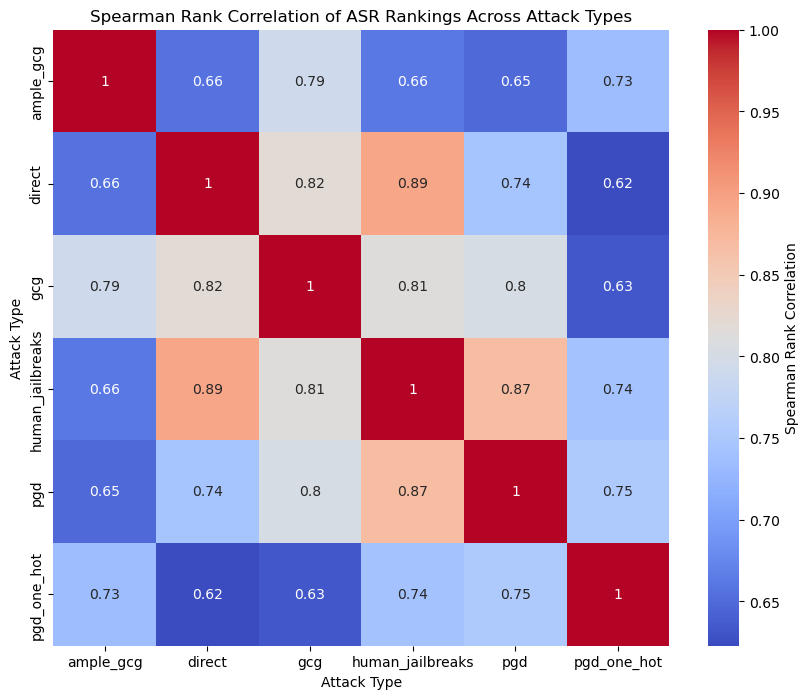

In [37]:
def rank_by_asr(idx, model_name: None|str|list[str] = None, attack_type: None|str|list[str] = None):
    if not isinstance(idx, list):
        idx = [idx]
    n = 0
    prompt_runs = filter_runs(df[df['prompt_idx'].isin(idx)], model_name, algorithm_type)
    # Group by 'prompt_idx' and calculate the metric for each group
    to_plot = (
        prompt_runs.groupby(['model', 'algorithm'])["asr_cais"]
        .apply(list)
        .to_dict()
    )
    y = []
    labels = []
    for key, values in to_plot.items():
        model, attack = key
        n += len(values)
        y.append(ragged_mean([[any(v)] for v in values])[0])
        labels.append(f"{model} | {attack}")
    y, labels = zip(*sorted(zip(y, labels), reverse=False))
    return y, labels


def plot_by_asr(idx, model_name: None|str|list[str] = None):
    attack_type = ['gcg', 'ample_gcg', 'human_jailbreaks', 'direct', 'pair']
    if not isinstance(idx, list):
        idx = [idx]
    n = 0
    prompt_runs = filter_runs(df[df['prompt_idx'].isin(idx)], model_name, attack_type)
    # Add a column for transformed 'asr_cais' based on the attack type
    prompt_runs['transformed_asr_cais'] = prompt_runs.apply(
        lambda run: [any(run['asr_cais'])]
        if run['algorithm'] in ('ample_gcg', 'human_jailbreaks', 'pair')
        else run['asr_cais'],
        axis=1
    )

    # Group by (model, attack) and aggregate the transformed values into lists
    to_plot = (
        prompt_runs.groupby([prompt_runs['model'],
                             prompt_runs['algorithm']])['transformed_asr_cais']
        .apply(list)
        .to_dict()
    )

    baseline_y = {}
    for key, values in to_plot.items():
        model, attack = key
        if attack == 'direct':
            baseline_y[model] = ragged_mean(values)[0]

    y = {}
    for key, values in to_plot.items():
        model, attack = key
        n += len(values)
        if attack != 'direct':
            y[f"{model} | {attack}"] = (ragged_mean(values)[0], baseline_y[model])
    y = sorted(y.items(), key=lambda x: x[1][0])

    plt.figure(figsize=(12, 12))
    # Plot baseline and other attack values as sub-bars
    for i, (label, (value, baseline)) in enumerate(y):
        plt.barh(label, baseline, color='blue', alpha=1.0)
        plt.barh(label, value, color='green', alpha=0.5)
    plt.title("Worst ASR for each model")
    plt.xlabel("ASR")
    plt.ylabel("Model | Attack")
    plt.legend(["Direct", "Other Attacks"])
    plt.tight_layout()

plot_by_asr(PROMPT_IDX, model_name=None)

attack_types = ['gcg', 'pgd', 'pgd_one_hot', 'ample_gcg', 'human_jailbreaks', 'direct']
sample_data = {}
for algorithm_type in attack_types:
    asrs, labels = rank_by_asr(PROMPT_IDX, model_name=None, attack_type=algorithm_type)
    for asr, label in zip(asrs, labels):
        print(f"{label}: {asr:.2f}")
        sample_data[f"{label}"] = asr

# Convert models and attack_types to sorted lists
models = sorted(list(models))
attack_types = sorted(list(attack_types))

# Rebuilding data for DataFrame creation
data = {attack: [sample_data.get(f"{model} | {attack}", np.nan) for model in models] for attack in attack_types}

# Create DataFrame with ASRs across attack types for each model
asr_df = pd.DataFrame(data, index=models)
# Calculate the correlation matrix
correlation_matrix = asr_df.corr()

# Plotting the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Correlation'})
plt.title("Correlation of ASR Rankings Across Attack Types")
plt.xlabel("Attack Type")
plt.ylabel("Attack Type")
plt.show()
from scipy.stats import spearmanr

# Calculate the Spearman rank-correlation matrix for the ASR values across attack types
spearman_corr_matrix, _ = spearmanr(asr_df, axis=0)
print(asr_df)

# Convert the Spearman correlation matrix to a DataFrame for easier interpretation and visualization
spearman_corr_df = pd.DataFrame(spearman_corr_matrix, index=asr_df.columns, columns=asr_df.columns)

# Plotting the Spearman rank-correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(spearman_corr_df, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Spearman Rank Correlation'})
plt.title("Spearman Rank Correlation of ASR Rankings Across Attack Types")
plt.xlabel("Attack Type")
plt.ylabel("Attack Type")
plt.show()

# Get sample completions

In [ ]:
def get_completions(idx, model_name=None, attack_type=None, n=10):
    prompt_runs = filter_runs(df[df["prompt_idx"].isin([idx])], model_name, attack_type)
    completions = defaultdict(list)
    for _, run in prompt_runs.iterrows():
        completions[f"{run['model']} | {run['attack']}"].extend(zip(run['completion'][:n], run['asr_cais'][:n]))
    return completions

for i in range(300):
    completions = get_completions(i, model_name='meta-llama/Meta-Llama', attack_type='human_jailbreaks', n=3)
    for key, values in completions.items():
        print('=='*20)
        print(f"{key}:")
        for completion, success in values:
            print(f"{'❗' if success else '✅'} |", completion.replace('\n', '/n')[:400] + ("...\n" if len(completion) > 400 else "\n"))

In [28]:
def to_wall_clock(attack_name, step):
    """
    Calculates the wall-clock time for a given attack name and number of steps.
    We measure attacking a single prompt from scratch.
    We do not include the time required for the last model generation (the one that will be judged).
    This way, we can interpret the plot as the time required to get to an attack with x% ASR likelihood.

    Parameters:
        attack_name (str): The name of the attack method.
        step (int): The number of attacks to calculate the wall-clock time for.

    Returns:
        float: The total wall-clock time for the specified number of attacks.
    """
    time_for_n_attacks = {
        "ample_gcg": {
            0: 0.,
            10: 12.744243145,
            20: 13.2931821823,
            100: 62.3875117302,
            200: 115.2193994522,
        },
        "ample_gcg_attacker_only": {
            0: 0.,
            10: 1.2804644107818604,
            20: 1.552985668182373,
            100: 4.802101135253906,
            200: 9.106863021850586,
        },
        "pair": {
            0: 0.0,
            1: 9.459330558776856,
            2: 45.435167053222656,
            3: 77.09345769882202,
            4: 108.45724320411682,
            5: 139.7215232849121,
            6: 173.72006225585938,
            7: 211.24724578857422,
            8: 249.24773120880127,
            9: 293.74813175201416,
            10: 340.7917413711548,
            11: 381.7989845275879,
            12: 423.7119436264038,
            13: 466.51243686676025,
            14: 507.86053943634033,
            15: 548.9827346801758,
            16: 589.4734926223755,
            17: 628.7439517974854,
            18: 670.9344730377197,
            19: 713.6168975830078,
            20: 756.2400751113892,
        },
        # "pair": {
        #     0: 0.,
        #     1: 28.3866248130798,
        #     2: 62.6897506713866,
        #     3: 94.178904056549,
        #     4: 125.6303825378418,
        #     5: 156.9727506637572,
        #     6: 190.9355297088622,
        #     7: 227.38192796707154,
        #     8: 264.6076273918152,
        #     9: 308.2196755409241,
        #     10: 354.41421461105347,
        #     11: 395.3086018562317,
        #     12: 437.4983158111572,
        #     13: 480.468740940094,
        #     14: 521.8476753234863,
        #     15: 562.8921008110046,
        #     16: 603.2101440429688,
        #     17: 642.4499249458313,
        #     18: 684.6959972381592,
        #     19: 727.4063339233398,
        #     20: 770.0663795471191,
        # },
        # "pair_attacker_only": {
        #     0: 0.,
        #     1: 9.459330558776856,
        #     2: 26.507873058319092,
        #     3: 40.911580085754395,
        #     4: 55.18991947174072,
        #     5: 69.45552587509155,
        #     6: 86.06214189529419,
        #     7: 105.36445140838623,
        #     8: 125.51614093780518,
        #     9: 152.01754140853882,
        #     10: 181.06115436553955,
        #     11: 204.66535758972168,
        #     12: 229.51988315582275,
        #     13: 255.33037519454956,
        #     14: 279.352831363678,
        #     15: 303.2730259895325,
        #     16: 326.22398471832275,
        #     17: 348.30546617507935,
        #     18: 373.40687131881714,
        #     19: 398.9011998176575,
        #     20: 424.3586006164551,
        # },
        # 'gcg':
        # {
        #     0: 0.,
        #     10: 46.020660400390625,
        #     50: 233.7491729259491,
        #     250: 1263.0246715545654,
        # },
        'gcg':
        {
            0: 0.,
            10: 34.93180727958679,
            50: 217.49874234199524,
            250: 1127.7786614894867,
        },
        # 'autodan': {
        #     10: 137.0680661201,
        #     51: 577.7480039597,
        #     100: 1286.0
        # },
        'autodan': {
            10: 118.53486871728,
            51: 538.6367740631,
            100: 1200.0,
        },
        'human_jailbreaks': {
            0: 0,
            10: 81.0,
            100: 891.0, # Slow because prompts are super long
        },
        'direct': {
            0: 0.,
            1: 1,
        },
        'pgd': {
            0: 0.,
            100: 12.,
        },
        # 'pgd_attacker_only': {
        #     0: 0.,
        #     100: 12.,
        # },
        'pgd_one_hot': {
            0: 0.,
            100: 12.,
            # 1: 11.,
            # 100: 1080.0,
        },
        # 'pgd_one_hot_attacker_only': {
        #     0: 0.,
        #     100: 12.,
        # }
    }
    # Fetch the attack data
    attack_data = time_for_n_attacks.get(attack_name)

    if not attack_data:
        raise ValueError(f"Attack name '{attack_name}' is not found in the data.")

    # Handle the case where the exact step is present
    if step in attack_data:
        return attack_data[step] + 9.0

    # If not, perform interpolation or extrapolation
    steps = sorted(attack_data.keys())
    times = [attack_data[s] for s in steps]

    if step < steps[0]:  # Extrapolate before the first step
        slope = (times[1] - times[0]) / (steps[1] - steps[0])
        return times[0] + slope * (step - steps[0]) + 9.0
    elif step > steps[-1]:  # Extrapolate after the last step
        slope = (times[-1] - times[-2]) / (steps[-1] - steps[-2])
        return times[-1] + slope * (step - steps[-1]) + 9.0
    else:  # Interpolate between known steps
        for i in range(1, len(steps)):
            if steps[i - 1] <= step <= steps[i]:
                slope = (times[i] - times[i - 1]) / (steps[i] - steps[i - 1])
                return times[i - 1] + slope * (step - steps[i - 1]) + 9.0

In [39]:
import numpy as np
import matplotlib.pyplot as plt

def plot_cumulative_scores(idx, metric='loss', model_name: None|str|list[str] = None, attack_type: None|str|list[str] = None, algorithm_params=None, exact_match=False, xaxis='step', include=['individual', 'mean', 'pareto']):
    assert xaxis in ('step', 'time')
    assert metric in ('loss', 'asr_cais', 'asr_prefix', 'sr_cais', 'sr_prefix')
    if not isinstance(idx, list):
        idx = [idx]

    # Get relevant runs
    prompt_runs = filter_runs(df[df['prompt_idx'].isin(idx)], model_name, attack_type, algorithm_params, exact_match)

    to_plot = {}
    for _, run in prompt_runs.iterrows():
        model, attack = run['model'], run['algorithm']
        key = (model, attack)
        agg_fun = aggregator_functions[attack]
        if metric == 'loss':
            to_plot.setdefault(key, []).append(-agg_fun(-np.array(run[metric])))
        elif metric in ('asr_cais', 'asr_prefix'):
            to_plot.setdefault(key, []).append(agg_fun(run[metric]))
        else:
            v = np.array([1 - v for v in run[metric.replace('sr_', 'asr_')]])
            to_plot.setdefault(key, []).append(-agg_fun(-v))

    def get_x_values(values, attack, xaxis):
        return (
            np.arange(len(values)) + 1 if xaxis == 'step'
            else np.array([to_wall_clock(attack, step) for step in range(len(values))])
        )

    def plot_individual_runs(ax, to_plot, metric, xaxis):
        """Plots individual run data."""
        for key, values in to_plot.items():
            model, attack = key
            color = get_color_for_run(model, attack)
            for value in values:
                x_values = get_x_values(value, attack, xaxis)
                alpha = min(0.1, 1.5 / len(values))
                if metric == 'loss':
                    ax.plot(x_values, value, alpha=alpha, color=color)
                else:
                    ax.scatter(x_values, value, alpha=alpha, color=color, s=2)

    def plot_mean_curves(ax, to_plot, xaxis, last_means):
        """Plots mean curves for each model and attack."""
        for key, values in to_plot.items():
            model, attack = key
            mean_values = ragged_mean(values, pad='max' if 'asr' in metric else 'min')
            x_values = get_x_values(mean_values, attack, xaxis)
            color = get_color_for_run(model, attack)
            ax.step(x_values, mean_values, where='post', label=f"{model} | {attack}", color=color)
            ax.text(x_values[-1], mean_values[-1], f"{model} | {attack}", fontsize=8, verticalalignment='center')
            last_means[f"{model} | {attack}"] = mean_values[-1]

    def add_avg_metric(ax, to_plot, xaxis, last_means):
        """Plots the average metric across all models."""
        avg_metric = ragged_mean([value for values in to_plot.values() for value in values], pad='max' if 'asr' in metric else 'min')
        x_values = np.arange(len(avg_metric)) + 1 if xaxis == 'step' else None
        last_means['Average'] = avg_metric[-1]
        ax.plot(x_values, avg_metric, label="Average", linestyle='--', color='black')

    def add_pareto_curve(ax, to_plot, xaxis):
        points = {}
        for k, v in to_plot.items():
            model, attack = k
            if model not in points:
                points[model] = []
            vals = ragged_mean(v, pad='max' if 'asr' in metric else 'min')
            steps = np.arange(len(vals)) + 1
            if xaxis == 'time':
                steps = np.array([to_wall_clock(attack, step) for step in steps])
            points[model].extend(zip(steps, vals))
        points = {k: sorted(p) for k, p in points.items()}
        x = {}
        y = {}
        for k, pts in points.items():
            if k not in x:
                x[k] = []
                y[k] = []
            for x_, y_ in pts:
                if not x[k] or ('asr' in metric and y_ > y[k][-1]) or ('asr' not in metric and y_ < y[k][-1]):
                    x[k].append(x_)
                    y[k].append(y_)

        max_time = max(max(x[k]) for k in x)
        for k in x:
            ax.step(x[k] + [max_time], y[k] + [y[k][-1]], where='post', linestyle='--', **get_model_style(k))
            if 'mean' not in include:
                ax.text(max_time, y[k][-1], f"{k}", fontsize=8, verticalalignment='center')

        # Find the maximum time among all models
        max_time = max(max(times) for times in x.values())
        min_time = min(min(times) for times in x.values() if len(times) > 0)
        max_time = max(max_time, min_time + .1)

        # Create a log-spaced time grid
        time_grid = np.linspace(np.log10(min_time), np.log10(max_time), num=300)

        # Plot and integrate for each model
        areas = {}
        for k in x:
            # Interpolate y values onto the log-spaced time grid
            if len(x[k]) > 1:
                interp_y = np.interp(time_grid, np.log10(x[k]), y[k])
                # Compute the area using trapezoidal rule
                area = np.trapz(interp_y, time_grid)
                areas[k] = area
            else:
                # If only one point, area is trivial or zero-length
                areas[k] = np.trapz(np.ones_like(time_grid) * y[k], time_grid)

        areas = dict(sorted(areas.items(), key=lambda x: -x[1]))
        return areas

    # Create a single figure with two subplots
    fig = plt.figure(figsize=(20, 8))
    gs = GridSpec(1, 2, figure=fig, width_ratios=[3, 1])  # First subplot takes 2/3, second takes 1/3

    ax1 = fig.add_subplot(gs[0, 0])  # Left side: cumulative scores
    ax2 = fig.add_subplot(gs[0, 1])    # Right side: bar plot of areas

    last_means = {}
    # Plot the cumulative scores (left subplot)
    if 'individual' in include:
        plot_individual_runs(ax1, to_plot, metric, xaxis)
    if 'mean' in include:
        plot_mean_curves(ax1, to_plot, xaxis, last_means)
    if 'pareto' in include:
        areas = add_pareto_curve(ax1, to_plot, xaxis)
    else:
        areas = None

    if metric == 'loss':
        ax1.set_yscale('log')
    if xaxis == 'time':
        ax1.set_xscale('symlog')
        ax1.set_xlabel("Wall Clock Time (Seconds)")
    else:
        add_avg_metric(ax1, to_plot, xaxis, last_means)
        ax1.set_xlabel("Step")

    # Legend and titles for left subplot
    ax1.set_title(f"{metric} for {len(prompt_runs)} runs across {len(idx)} prompts, model={model_name or 'All'}, attack={attack_type or 'All'}")
    ax1.grid(True, axis='y', linestyle='--', linewidth=0.5)

    handles, labels = ax1.get_legend_handles_labels()
    if handles and labels:
        sorted_legend = sorted(zip(labels, handles), key=lambda x: -last_means.get(x[0], 0))
        sorted_labels, sorted_handles = zip(*sorted_legend)
        ax1.legend(sorted_handles, sorted_labels, loc='center left', bbox_to_anchor=(1, 0.5))

    # Plot the areas as a bar plot (right subplot)
    if areas:
        ax2.bar(areas.keys(), areas.values(), color='skyblue')
        ax2.set_ylabel('Area Under Curve')
        ax2.set_title('Area Under Pareto Curves for Each Model')
        plt.setp(ax2.get_xticklabels(), rotation=40, ha='right')

    plt.tight_layout()
    plt.show()
    return areas

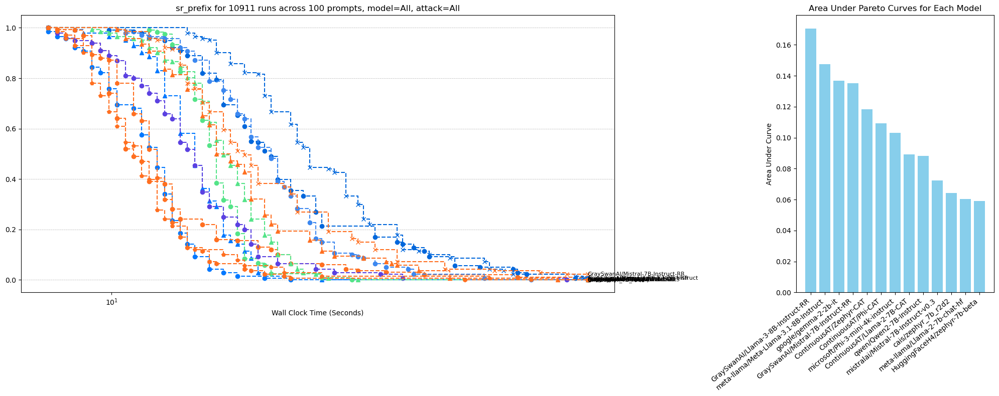

In [70]:
areas = plot_cumulative_scores(PROMPT_IDX, 'sr_prefix', model_name=None, attack_type=None, exact_match=True, xaxis='time', include='pareto')

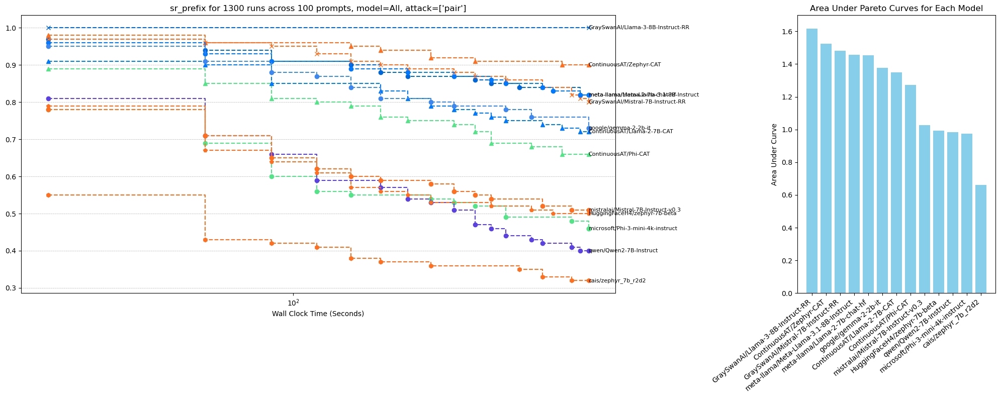

In [41]:
areas = plot_cumulative_scores(PROMPT_IDX, 'sr_prefix', model_name=None, attack_type=['pair'], exact_match=True, xaxis='time', include='pareto')

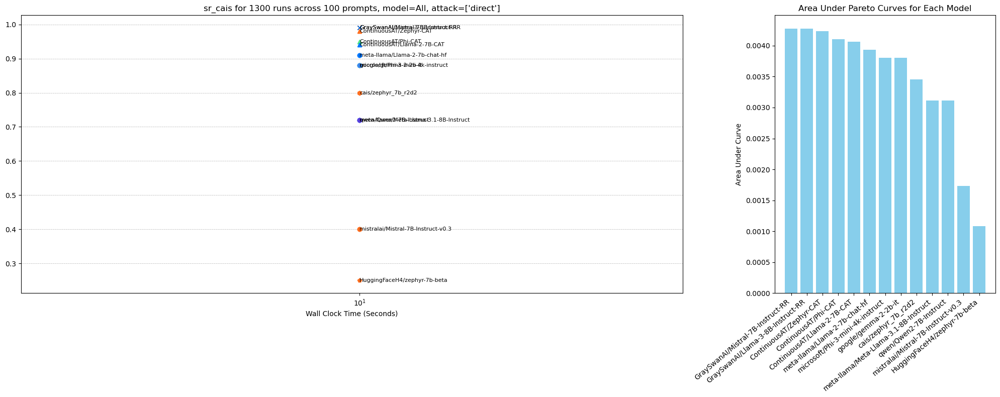

In [32]:
areas = plot_cumulative_scores(PROMPT_IDX, 'sr_cais', model_name=None, attack_type=['direct'], exact_match=True, xaxis='time', include='pareto')

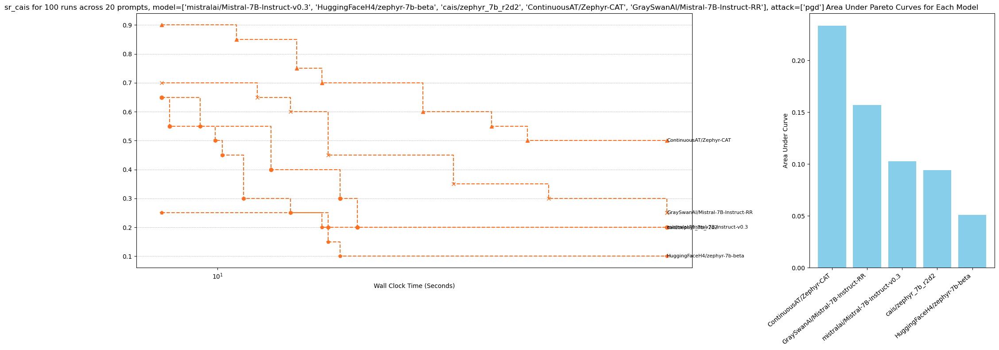

In [82]:
areas = plot_cumulative_scores(
    PROMPT_IDX[:20],
    "sr_cais",
    model_name=[
        "mistralai/Mistral-7B-Instruct-v0.3",
        "HuggingFaceH4/zephyr-7b-beta",
        "cais/zephyr_7b_r2d2",
        "ContinuousAT/Zephyr-CAT",
        "GraySwanAI/Mistral-7B-Instruct-RR",
    ],
    attack_type=["pgd"],
    algorithm_params={"placement": "command"},
    # exact_match=True,
    xaxis="time",
    include="pareto",
)

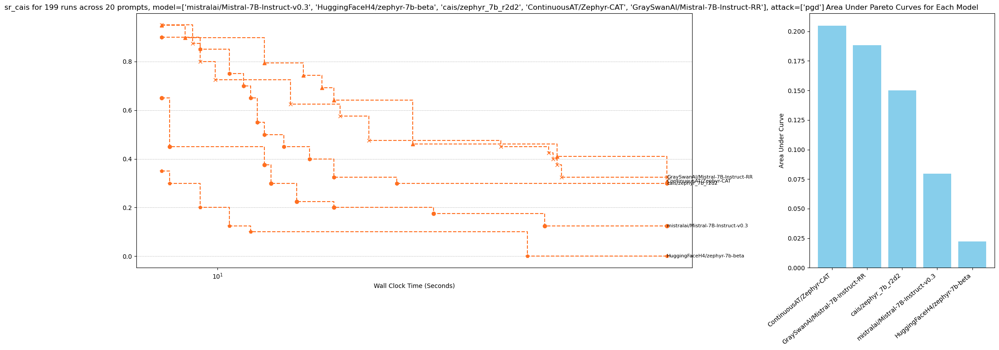

In [81]:
areas = plot_cumulative_scores(
    PROMPT_IDX[:20],
    "sr_cais",
    model_name=[
        "mistralai/Mistral-7B-Instruct-v0.3",
        "HuggingFaceH4/zephyr-7b-beta",
        "cais/zephyr_7b_r2d2",
        "ContinuousAT/Zephyr-CAT",
        "GraySwanAI/Mistral-7B-Instruct-RR",
    ],
    attack_type=["pgd"],
    algorithm_params={"placement": "suffix"},
    # exact_match=True,
    xaxis="time",
    include="pareto",
)

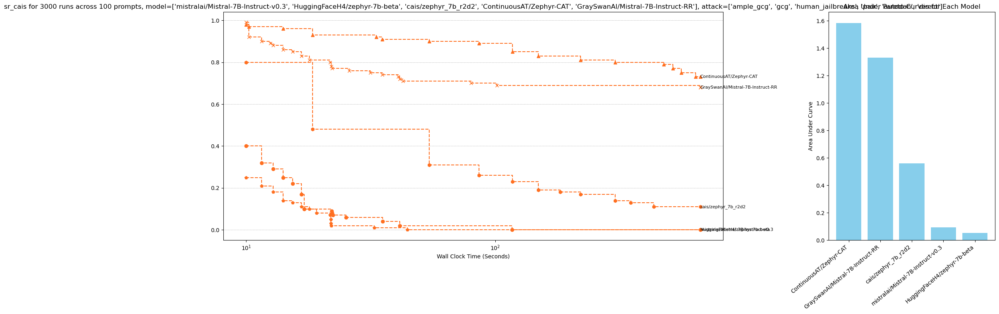

In [34]:
areas = plot_cumulative_scores(
    PROMPT_IDX,
    "sr_cais",
    model_name=[
        "mistralai/Mistral-7B-Instruct-v0.3",
        "HuggingFaceH4/zephyr-7b-beta",
        "cais/zephyr_7b_r2d2",
        "ContinuousAT/Zephyr-CAT",
        "GraySwanAI/Mistral-7B-Instruct-RR",
    ],
    attack_type=["ample_gcg", "gcg", "human_jailbreaks", "pair", "autodan", "direct"],
    exact_match=True,
    xaxis="time",
    include="pareto",
)

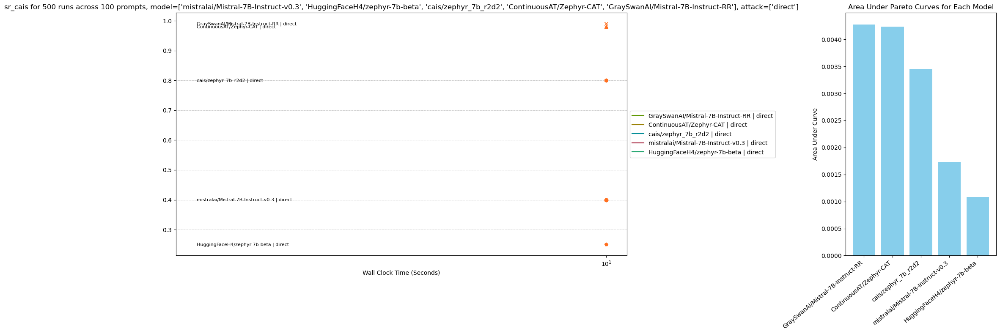

In [36]:
areas = plot_cumulative_scores(
    PROMPT_IDX,
    "sr_cais",
    model_name=[
        "mistralai/Mistral-7B-Instruct-v0.3",
        "HuggingFaceH4/zephyr-7b-beta",
        "cais/zephyr_7b_r2d2",
        "ContinuousAT/Zephyr-CAT",
        "GraySwanAI/Mistral-7B-Instruct-RR",
    ],
    attack_type=["direct"],
    exact_match=True,
    xaxis="time",
    include=["pareto", "mean"],
)

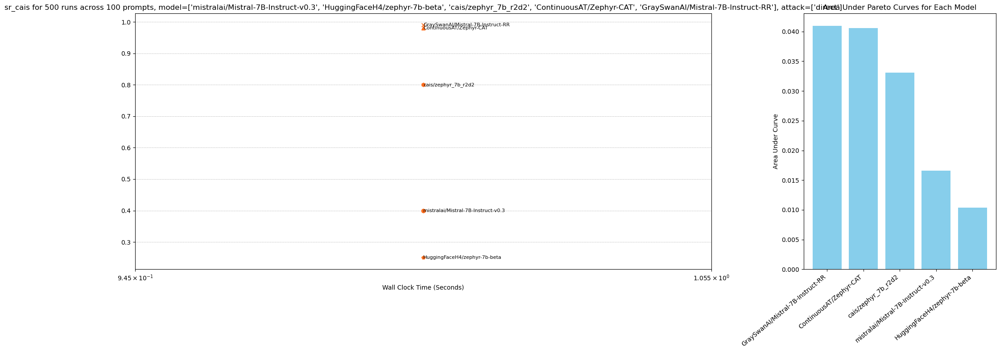

In [46]:
reas = plot_cumulative_scores(
    PROMPT_IDX,
    "sr_cais",
    model_name=[
        "mistralai/Mistral-7B-Instruct-v0.3",
        "HuggingFaceH4/zephyr-7b-beta",
        "cais/zephyr_7b_r2d2",
        "ContinuousAT/Zephyr-CAT",
        "GraySwanAI/Mistral-7B-Instruct-RR",
    ],
    attack_type=["direct"],
    exact_match=True,
    xaxis="time",
    include="pareto",
)

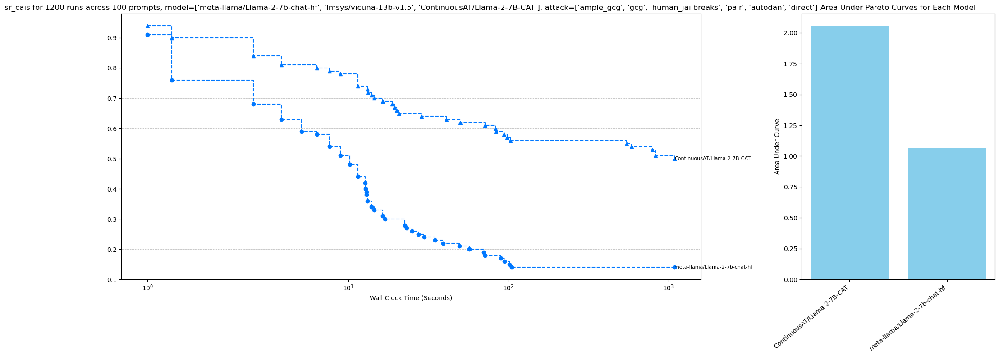

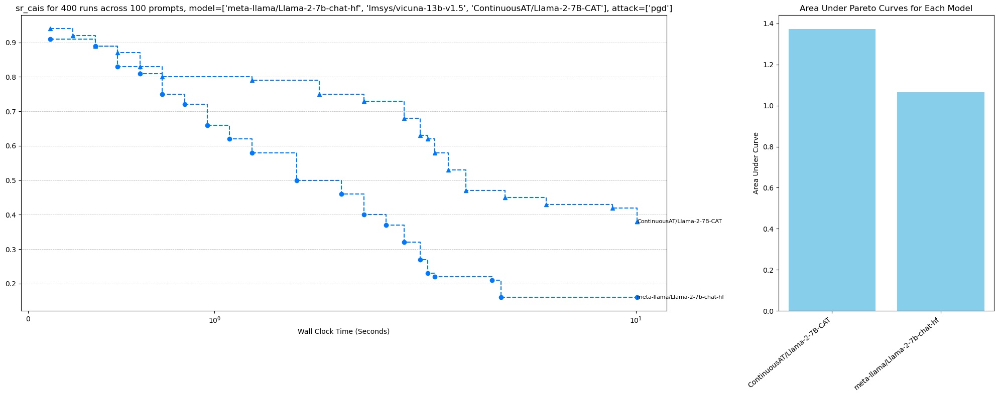

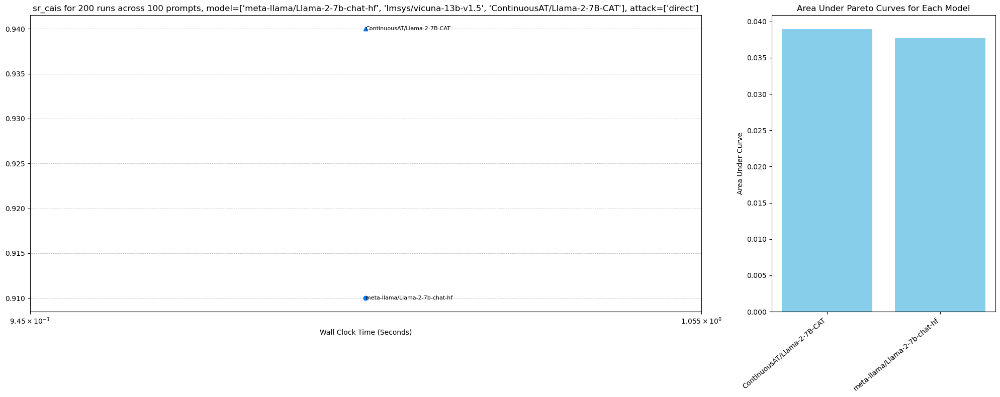

In [47]:
areas = plot_cumulative_scores(
    PROMPT_IDX,
    "sr_cais",
    model_name=[
        "meta-llama/Llama-2-7b-chat-hf",
        "lmsys/vicuna-13b-v1.5",
        "ContinuousAT/Llama-2-7B-CAT",
    ],
    attack_type=['ample_gcg', 'gcg', 'human_jailbreaks', 'pair', 'autodan', 'direct'],
    exact_match=True,
    xaxis="time",
    include="pareto",
)

areas = plot_cumulative_scores(
    PROMPT_IDX,
    "sr_cais",
    model_name=[
        "meta-llama/Llama-2-7b-chat-hf",
        "lmsys/vicuna-13b-v1.5",
        "ContinuousAT/Llama-2-7B-CAT",
    ],
    attack_type=["pgd"],
    exact_match=True,
    xaxis="time",
    include="pareto",
)
areas = plot_cumulative_scores(
    PROMPT_IDX,
    "sr_cais",
    model_name=[
        "meta-llama/Llama-2-7b-chat-hf",
        "lmsys/vicuna-13b-v1.5",
        "ContinuousAT/Llama-2-7B-CAT",
    ],
    attack_type=["direct"],
    exact_match=True,
    xaxis="time",
    include="pareto",
)




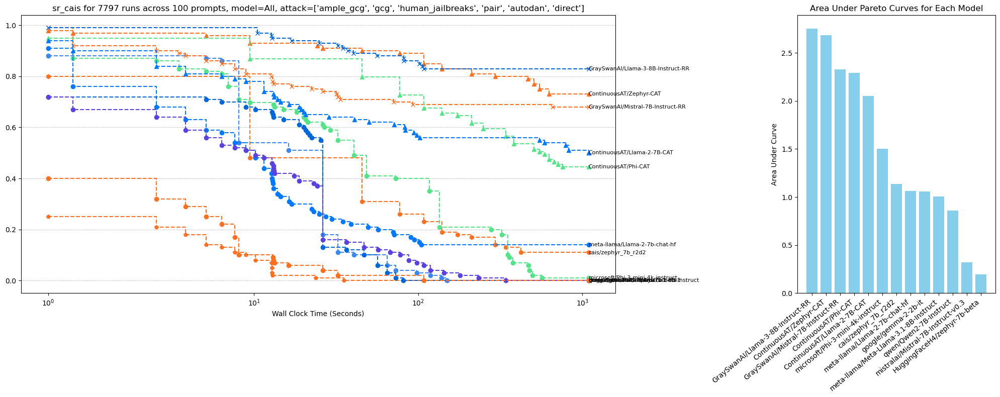

In [48]:
areas = plot_cumulative_scores(PROMPT_IDX, 'sr_cais', model_name=None, attack_type=['ample_gcg', 'gcg', 'human_jailbreaks', 'pair', 'autodan', 'direct'], exact_match=True, xaxis='time', include='pareto')

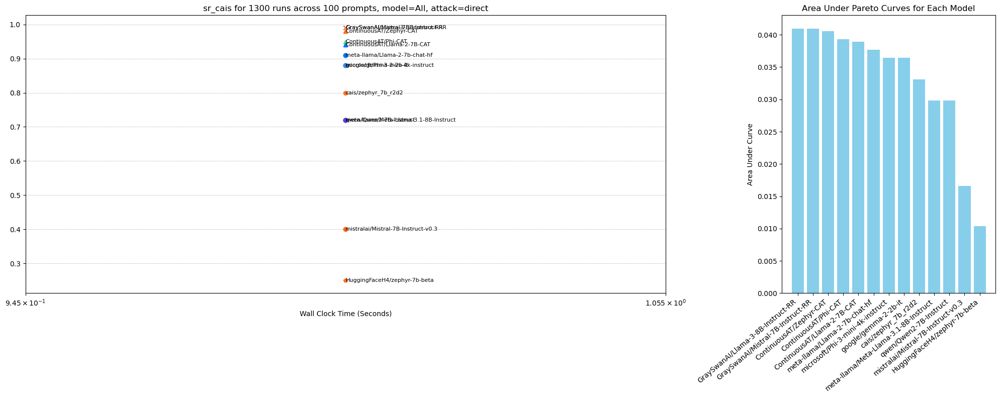

In [49]:
areas_direct = plot_cumulative_scores(PROMPT_IDX, 'sr_cais', model_name=None, attack_type="direct", exact_match=True, include=['pareto'], xaxis='time')

In [ ]:
import numpy as np


def get_auc(idx, metric='loss', model_name: None|str|list[str] = None, attack_type: None|str|list[str] = None, exact_match=False, step=None):
    assert metric in ('loss', 'asr_cais', 'asr_prefix', 'sr_cais', 'sr_prefix')
    if not isinstance(idx, list):
        idx = [idx]

    # Get relevant runs
    prompt_runs = filter_runs(df[df['prompt_idx'].isin(idx)], model_name, attack_type, exact_match)

    to_plot = {}
    for _, run in prompt_runs.iterrows():
        model, attack = run['model'], run['algorithm']
        key = (model, attack)
        if metric == 'loss':
            to_plot.setdefault(key, []).append(-aggregator_functions[attack](-np.array(run[metric])))
        elif metric in ('asr_cais', 'asr_prefix'):
            to_plot.setdefault(key, []).append(aggregator_functions[attack](run[metric]))
        else:
            v = np.array([1 - v for v in run[metric.replace('sr_', 'asr_')]])
            to_plot.setdefault(key, []).append(-aggregator_functions[attack](-v))


    def add_pareto_curve(to_plot):
        points = {}
        for (model, attack), v in to_plot.items():
            if model not in points:
                points[model] = []
            vals = ragged_mean(v, pad='max' if 'asr' in metric else 'min')
            steps = np.arange(len(vals)) + 1
            if step is None:
                steps = np.array([to_wall_clock(attack, step) for step in steps])
            points[model].extend(zip(steps, vals))
        points = {k: sorted(p) for k, p in points.items()}
        x = {}
        y = {}
        for k, pts in points.items():
            if k not in x:
                x[k] = []
                y[k] = []
            for x_, y_ in pts:
                if not x[k] or ('asr' in metric and y_ > y[k][-1]) or ('asr' not in metric and y_ < y[k][-1]):
                    x[k].append(x_)
                    y[k].append(y_)

        # Find the maximum time among all models
        max_time = max(max(times) for times in x.values())
        min_time = min(min(times) for times in x.values() if len(times) > 0)
        max_time = max(max_time, min_time + .1)

        # Create a log-spaced time grid
        time_grid = np.linspace(np.log10(min_time), np.log10(max_time), num=300)

        # Plot and integrate for each model
        areas = {}
        last_val = {}
        for k in x:
            # Interpolate y values onto the log-spaced time grid
            if len(x[k]) > 1:
                interp_y = np.interp(time_grid, np.log10(x[k]), y[k])
                # Compute the area using trapezoidal rule
                area = np.trapz(interp_y, time_grid)
                areas[k] = area
            else:
                # If only one point, area is trivial or zero-length
                areas[k] = np.trapz(np.ones_like(time_grid) * y[k], time_grid)
            if step is not None:
                interp_y = np.interp(np.arange(step+1), x[k], y[k])
                last_val[k] = interp_y[step]

        areas = dict(sorted(areas.items(), key=lambda x: -x[1]))
        return areas, last_val

    areas, last_val = add_pareto_curve(to_plot)

    return areas, last_val

In [51]:
import numpy as np
import matplotlib.pyplot as plt

def inspect_pgd(idx, metric='loss', model_name: None|str|list[str] = None, exact_match=False, step=None):
    assert metric in ('loss', 'asr_cais', 'asr_prefix', 'sr_cais', 'sr_prefix')
    if not isinstance(idx, list):
        idx = [idx]

    # Get relevant runs
    prompt_runs = filter_runs(df[df['prompt_idx'].isin(idx)], model_name, "pgd", {"placement": "command"}, exact_match)

    to_plot = {}
    for _, run in prompt_runs.iterrows():
        model, attack = run['model'], run['algorithm']
        key = (model, attack)
        if metric == 'loss':
            to_plot.setdefault(key, []).append(-aggregator_functions[attack](-np.array(run[metric])))
        elif metric in ('asr_cais', 'asr_prefix'):
            to_plot.setdefault(key, []).append(aggregator_functions[attack](run[metric]))
        else:
            v = np.array([1 - v for v in run[metric.replace('sr_', 'asr_')]])
            to_plot.setdefault(key, []).append(-aggregator_functions[attack](-v))

    def add_pareto_curve(to_plot):
        points = {}
        for (model, attack), v in to_plot.items():
            if model not in points:
                points[model] = []
            vals = ragged_mean(v, pad='max' if 'asr' in metric else 'min')
            steps = np.arange(len(vals)) + 1
            if step is None:
                steps = np.array([to_wall_clock(attack, step) for step in steps])
            points[model].extend(zip(steps, vals))
        points = {k: sorted(p) for k, p in points.items()}
        x = {}
        y = {}
        for k, pts in points.items():
            if k not in x:
                x[k] = []
                y[k] = []
            for x_, y_ in pts:
                if not x[k] or ('asr' in metric and y_ > y[k][-1]) or ('asr' not in metric and y_ < y[k][-1]):
                    x[k].append(x_)
                    y[k].append(y_)

        # Find the maximum time among all models
        max_time = max(max(times) for times in x.values())
        min_time = min(min(times) for times in x.values() if len(times) > 0)
        max_time = max(max_time, min_time + .1)

        # Create a log-spaced time grid
        time_grid = np.linspace(np.log10(min_time), np.log10(max_time), num=300)

        # Plot and integrate for each model
        last_val = {}
        for k in x:
            interp_y = np.interp(np.arange(step+1), x[k], y[k])
            last_val[k] = interp_y[step]

        return last_val

    last_val = add_pareto_curve(to_plot)

    return last_val

{'GraySwanAI/Llama-3-8B-Instruct-RR': 2.7537968384083067, 'ContinuousAT/Zephyr-CAT': 2.6846676996941667, 'GraySwanAI/Mistral-7B-Instruct-RR': 2.3274929278492404, 'ContinuousAT/Phi-CAT': 2.2917729819901482, 'ContinuousAT/Llama-2-7B-CAT': 2.052657778484301, 'microsoft/Phi-3-mini-4k-instruct': 1.5024169917050738, 'cais/zephyr_7b_r2d2': 1.138435765610738, 'meta-llama/Llama-2-7b-chat-hf': 1.0638979650257094, 'google/gemma-2-2b-it': 1.0564043914284138, 'meta-llama/Meta-Llama-3.1-8B-Instruct': 1.0057099086535217, 'qwen/Qwen2-7B-Instruct': 0.8607209897612095, 'mistralai/Mistral-7B-Instruct-v0.3': 0.31971394923446406, 'HuggingFaceH4/zephyr-7b-beta': 0.19508736520072828}
Correlation Direct: 0.9340659340659341
Correlation PGD: 0.06593406593406594


/tmp/ipykernel_641852/2904899975.py:49: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


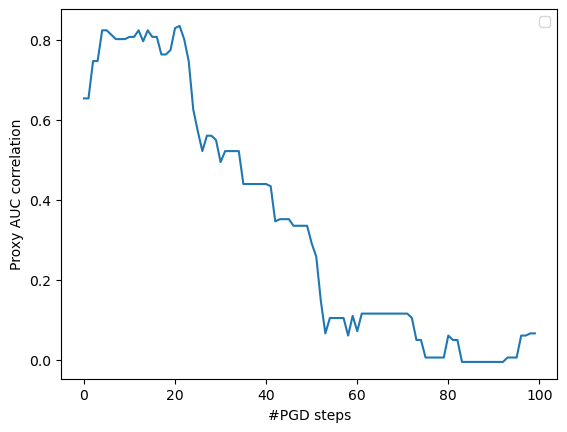

In [69]:
import numpy as np
# PGD perturb tokens only limited range
areas, _ = get_auc(PROMPT_IDX, 'sr_cais', model_name=None, attack_type=['ample_gcg', 'gcg', 'human_jailbreaks', 'pair', 'autodan', 'direct'], exact_match=True)
print(areas)
areas_direct, _ = get_auc(PROMPT_IDX, 'sr_cais', model_name=None, attack_type="direct", exact_match=True)
# rank correlation
corrs = []

def spearman_rank_correlation(x, y):
    # Convert values to ranks
    rank_x = np.argsort(np.argsort(x))
    rank_y = np.argsort(np.argsort(y))

    # Compute Pearson correlation on ranks
    return np.corrcoef(rank_x, rank_y)[0, 1]

def kendalls_tau(x, y):
    n = len(x)
    concordant = 0
    discordant = 0

    for i in range(n):
        for j in range(i + 1, n):
            concordant += np.sign(x[i] - x[j]) == np.sign(y[i] - y[j])
            discordant += np.sign(x[i] - x[j]) != np.sign(y[i] - y[j])

    return (concordant - discordant) / (n * (n - 1) / 2)

for i in range(100):
    areas_pgd = inspect_pgd(PROMPT_IDX, 'loss', model_name=None, exact_match=True, step=i)
    # Extract values from both dictionaries
    area_values = []
    area_direct_values = []
    areas_pgd_values = []
    for k in areas:
        area_values.append(areas[k])
        area_direct_values.append(areas_direct[k])
        areas_pgd_values.append(areas_pgd[k])
    # Compute correlation matrix using np.corrcoef
    # correlation_direct = np.corrcoef(area_values, area_direct_values)[0, 1]
    correlation_direct = spearman_rank_correlation(area_values, area_direct_values)
    # correlation_pgd = np.corrcoef(area_values, areas_pgd_values)[0, 1]
    correlation_pgd = spearman_rank_correlation(area_values, areas_pgd_values)
    corrs.append(correlation_pgd)
# Extract the correlation coefficient
plt.plot(corrs)
# plt.plot(area_values, np.array(area_direct_values) * 39, 'o', label='Direct')
# plt.plot(area_values, areas_pgd_values, 'o', label='PGD')
plt.legend()
plt.xlabel('#PGD steps')
plt.ylabel('Proxy AUC correlation')
print(f"Correlation Direct: {correlation_direct}")
print(f"Correlation PGD: {correlation_pgd}")

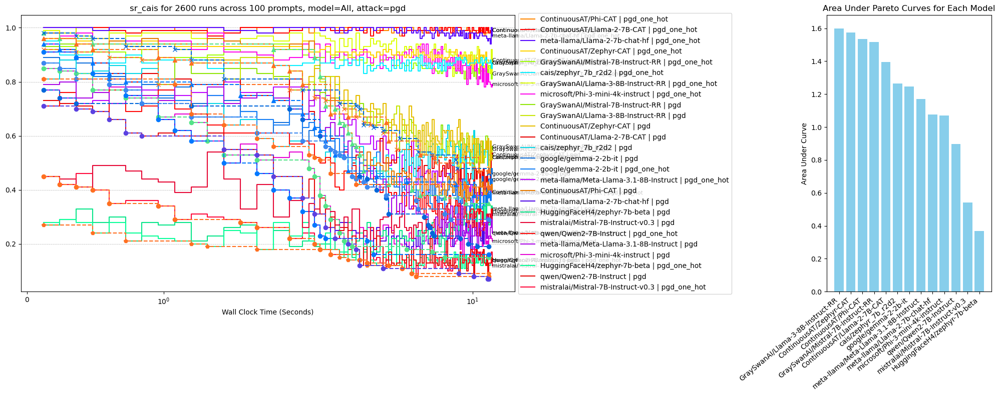

{'GraySwanAI/Llama-3-8B-Instruct-RR': 1.5997746719461814,
 'ContinuousAT/Zephyr-CAT': 1.574093378236697,
 'ContinuousAT/Phi-CAT': 1.5350730121182747,
 'GraySwanAI/Mistral-7B-Instruct-RR': 1.5174765071042602,
 'ContinuousAT/Llama-2-7B-CAT': 1.3956940882271605,
 'cais/zephyr_7b_r2d2': 1.2642598387042654,
 'google/gemma-2-2b-it': 1.2464600254373892,
 'meta-llama/Meta-Llama-3.1-8B-Instruct': 1.170740834976134,
 'meta-llama/Llama-2-7b-chat-hf': 1.0760353985561228,
 'microsoft/Phi-3-mini-4k-instruct': 1.0706045006932494,
 'qwen/Qwen2-7B-Instruct': 0.8963221290291545,
 'mistralai/Mistral-7B-Instruct-v0.3': 0.5408284749110721,
 'HuggingFaceH4/zephyr-7b-beta': 0.36819361652268856}

In [70]:
plot_cumulative_scores(PROMPT_IDX, 'sr_cais', model_name=None, attack_type='pgd', exact_match=True, include=['pareto', 'mean'], xaxis='time')

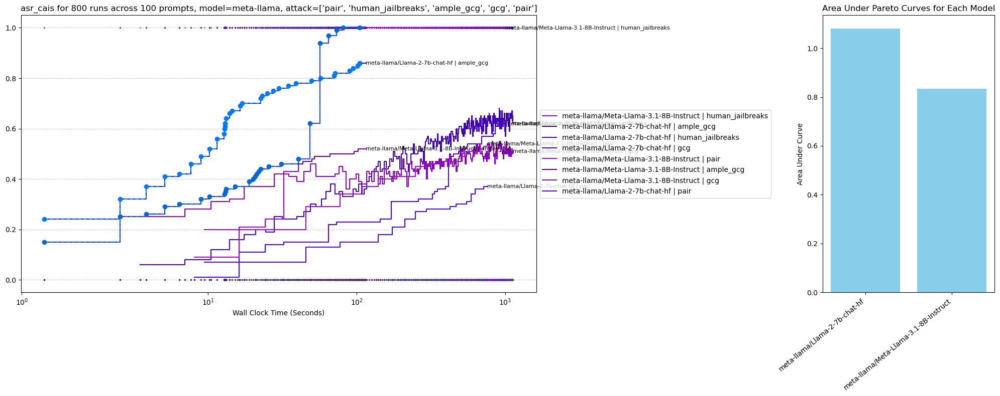

{'meta-llama/Llama-2-7b-chat-hf': 1.0810340114617725,
 'meta-llama/Meta-Llama-3.1-8B-Instruct': 0.8348143236914619}

In [56]:
plot_cumulative_scores(PROMPT_IDX, 'asr_cais', model_name='meta-llama', attack_type=['pair', 'human_jailbreaks', 'ample_gcg', 'gcg', 'pair'], exact_match=False, xaxis='time')

# Removal/Editing 

In [57]:
delete_pattern = {
    # 'model': 'meta-llama/Llama-2-7b-chat-hf',
    # 'model': 'ContinuousAT/Llama-2-7B-CAT',
    'attack': 'pair',
    # 'idx': 0,
}

data_path = '../outputs'
to_delete = []
for folder in os.listdir(data_path):
    # if folder in dates:
    for root, dirs, files in os.walk(os.path.join(data_path, folder)):
        for file in files:
            if file.endswith('run.json'):
                data = pd.read_json(os.path.join(root, file))
                for i in range(len(data)):
                    run = data.iloc[i]
                    config = run['config']
                    if all(config[k] == v for k, v in delete_pattern.items()):
                        to_delete.append(os.path.join(root, file))
                        break
print(f'Found {len(to_delete)} runs to delete.')

KeyboardInterrupt: 

In [ ]:
import shutil

old_outputs_path = '../old_outputs'
confirm = input(f'Are you sure you want to move {len(to_delete)} files to {old_outputs_path}? (yes, please/n) ')
if confirm != 'yes, please':
    print('Aborting...')
else:
    for file_path in to_delete:
        # Create the new directory path in old_outputs
        new_dir_path = os.path.join(old_outputs_path, os.path.relpath(file_path, '../outputs'))
        os.makedirs(os.path.dirname(new_dir_path), exist_ok=True)

        # Move the file to the new directory
        print(f'Moving {file_path} to {new_dir_path}')
        shutil.move(file_path, new_dir_path)

        # Check if the original directory is empty and delete it if it is
        original_dir = os.path.dirname(file_path)
        if not os.listdir(original_dir):
            print(f'Deleting empty directory {original_dir}')
            os.rmdir(original_dir)

Aborting...


In [ ]:
# Amount of time until attack with x% ASR likelihood is *ready to be sent to target*
# For parallel attacks with low individual success rates, this includes the time required for all prior attack gens + previous model queries since those are an unavoidable cost